In [ ]:
#import the necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import matplotlib.ticker as ticker

In [ ]:
df = pd.read_csv('SampleSuperstore.csv', encoding='ISO-8859-1')


In [ ]:
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [ ]:
df.shape

(9994, 21)

In [ ]:
# Characteristics of the variables in the dataset
df.info() # Basic overview of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9994 non-null   int64  
 1   Order ID       9994 non-null   object 
 2   Order Date     9994 non-null   object 
 3   Ship Date      9994 non-null   object 
 4   Ship Mode      9994 non-null   object 
 5   Customer ID    9994 non-null   object 
 6   Customer Name  9994 non-null   object 
 7   Segment        9994 non-null   object 
 8   Country        9994 non-null   object 
 9   City           9994 non-null   object 
 10  State          9994 non-null   object 
 11  Postal Code    9994 non-null   int64  
 12  Region         9994 non-null   object 
 13  Product ID     9994 non-null   object 
 14  Category       9994 non-null   object 
 15  Sub-Category   9994 non-null   object 
 16  Product Name   9994 non-null   object 
 17  Sales          9994 non-null   float64
 18  Quantity

In [ ]:
# Characteristics of the variables in the dataset
df.describe() # Summary statistics for numerical columns

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,55190.379428,229.858001,3.789574,0.156203,28.656896
std,2885.163629,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1.000000,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,99301.000000,22638.480000,14.000000,0.800000,8399.976000


In [ ]:
# Characteristics of the variables in the dataset
# Check unique values for categorical columns
for col in df.select_dtypes(include=['object']):
    print(f"{col}: {df[col].unique()[:10]}")  # Show up to 10 unique values

Order ID: ['CA-2016-152156' 'CA-2016-138688' 'US-2015-108966' 'CA-2014-115812'
 'CA-2017-114412' 'CA-2016-161389' 'US-2015-118983' 'CA-2014-105893'
 'CA-2014-167164' 'CA-2014-143336']
Order Date: ['11/8/2016' '6/12/2016' '10/11/2015' '6/9/2014' '4/15/2017' '12/5/2016'
 '11/22/2015' '11/11/2014' '5/13/2014' '8/27/2014']
Ship Date: ['11/11/2016' '6/16/2016' '10/18/2015' '6/14/2014' '4/20/2017'
 '12/10/2016' '11/26/2015' '11/18/2014' '5/15/2014' '9/1/2014']
Ship Mode: ['Second Class' 'Standard Class' 'First Class' 'Same Day']
Customer ID: ['CG-12520' 'DV-13045' 'SO-20335' 'BH-11710' 'AA-10480' 'IM-15070'
 'HP-14815' 'PK-19075' 'AG-10270' 'ZD-21925']
Customer Name: ['Claire Gute' 'Darrin Van Huff' "Sean O'Donnell" 'Brosina Hoffman'
 'Andrew Allen' 'Irene Maddox' 'Harold Pawlan' 'Pete Kriz'
 'Alejandro Grove' 'Zuschuss Donatelli']
Segment: ['Consumer' 'Corporate' 'Home Office']
Country: ['United States']
City: ['Henderson' 'Los Angeles' 'Fort Lauderdale' 'Concord' 'Seattle'
 'Fort Worth' 'M

In [ ]:
# Range, Mean, Median, and Mode of numerical variables
for col in df.select_dtypes(include=[np.number]):
    print(f"{col} -> Range: {df[col].max() - df[col].min()}, "
          f"Mean: {df[col].mean()}, Median: {df[col].median()}, Mode: {df[col].mode()[0]}")

Row ID -> Range: 9993, Mean: 4997.5, Median: 4997.5, Mode: 1
Postal Code -> Range: 98261, Mean: 55190.3794276566, Median: 56430.5, Mode: 10035
Sales -> Range: 22638.036, Mean: 229.85800083049833, Median: 54.489999999999995, Mode: 12.96
Quantity -> Range: 13, Mean: 3.789573744246548, Median: 3.0, Mode: 3
Discount -> Range: 0.8, Mean: 0.15620272163297977, Median: 0.2, Mode: 0.0
Profit -> Range: 14999.954000000002, Mean: 28.65689630778467, Median: 8.6665, Mode: 0.0


In [ ]:
# Dealing with missing values
print(df.isnull().sum())

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64


In [ ]:
# Count the number of duplicate rows
num_duplicates = df.duplicated().sum()

print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


In [ ]:
df['Postal Code'] = df['Postal Code'].astype(int)

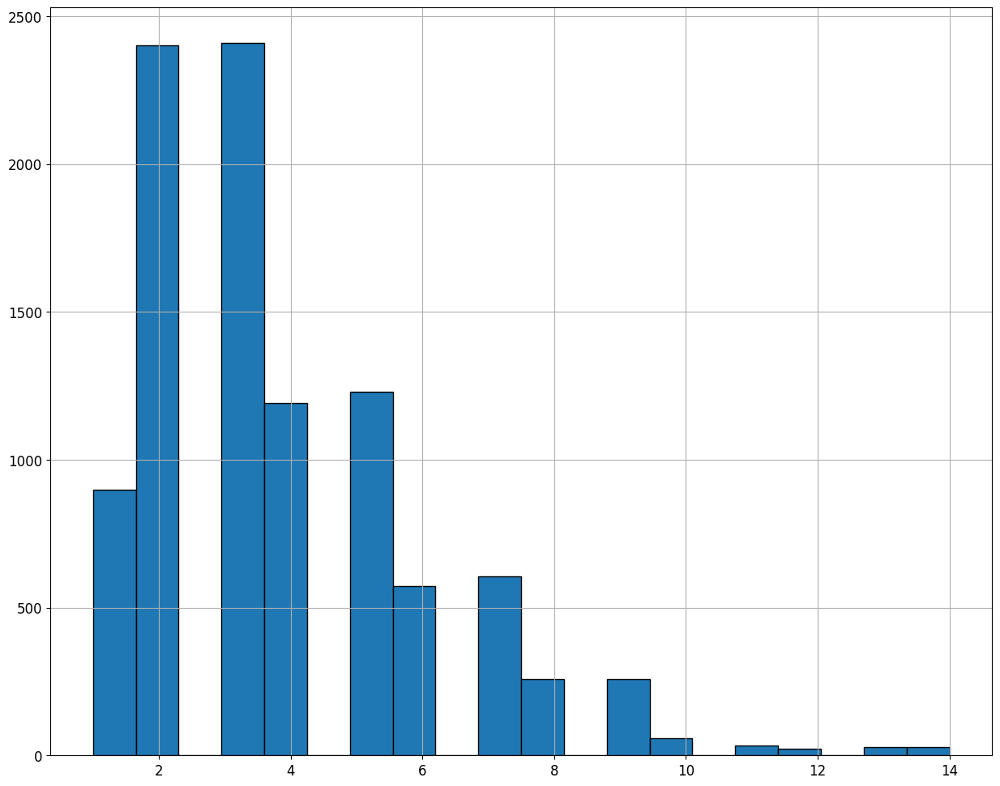

In [ ]:
# Set the figure size
plt.figure(figsize=(15, 12))

# Plot histograms for all features
df['Quantity'].hist(bins=20, figsize=(15, 12), edgecolor='black')

plt.show()

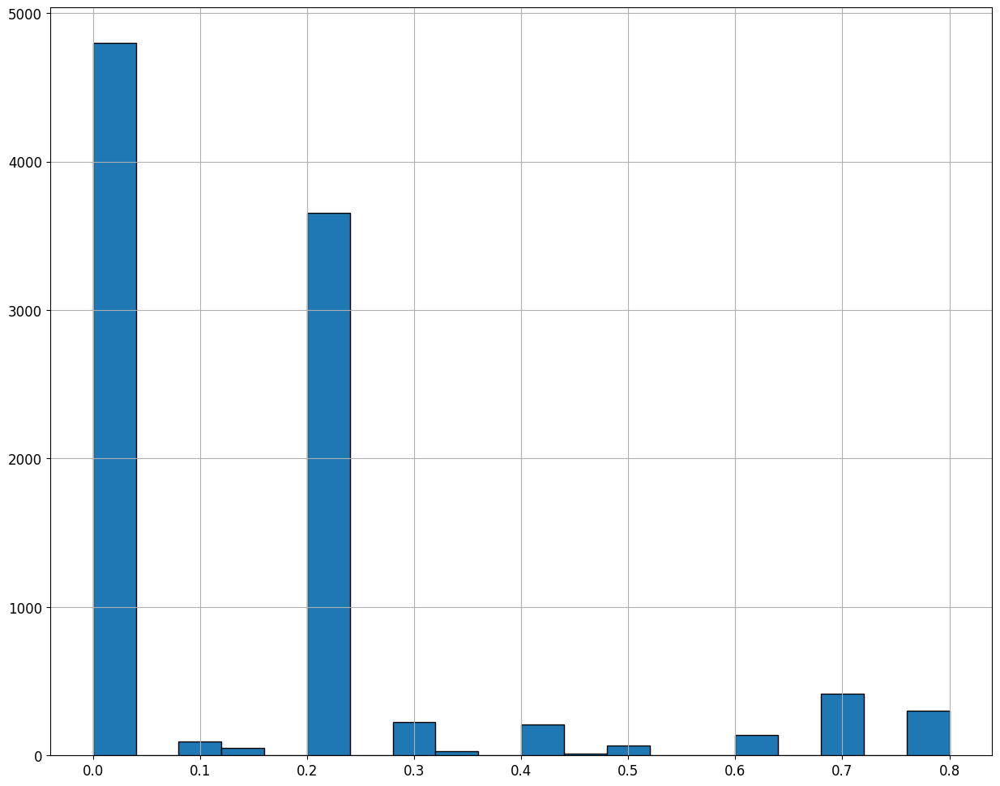

In [ ]:
# Set the figure size
plt.figure(figsize=(15, 12))

# Plot histograms for all features
df['Discount'].hist(bins=20, figsize=(15, 12), edgecolor='black')

plt.show()

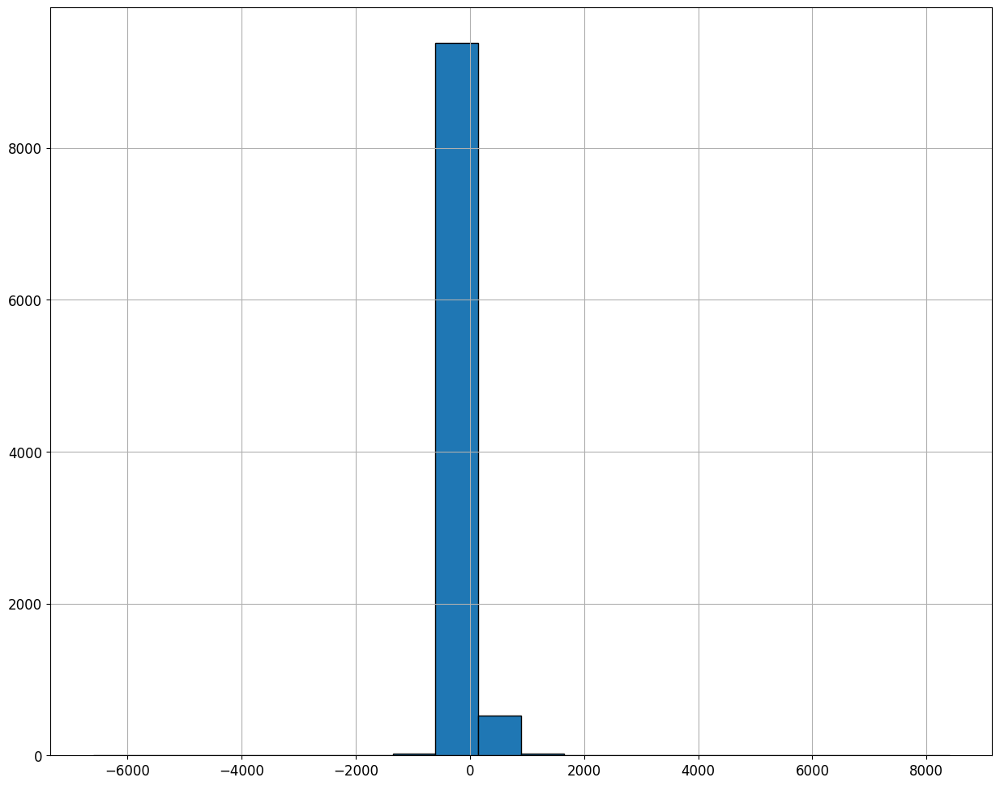

In [ ]:
# Set the figure size
plt.figure(figsize=(15, 12))

# Plot histograms for all features
df['Profit'].hist(bins=20, figsize=(15, 12), edgecolor='black')

plt.show()

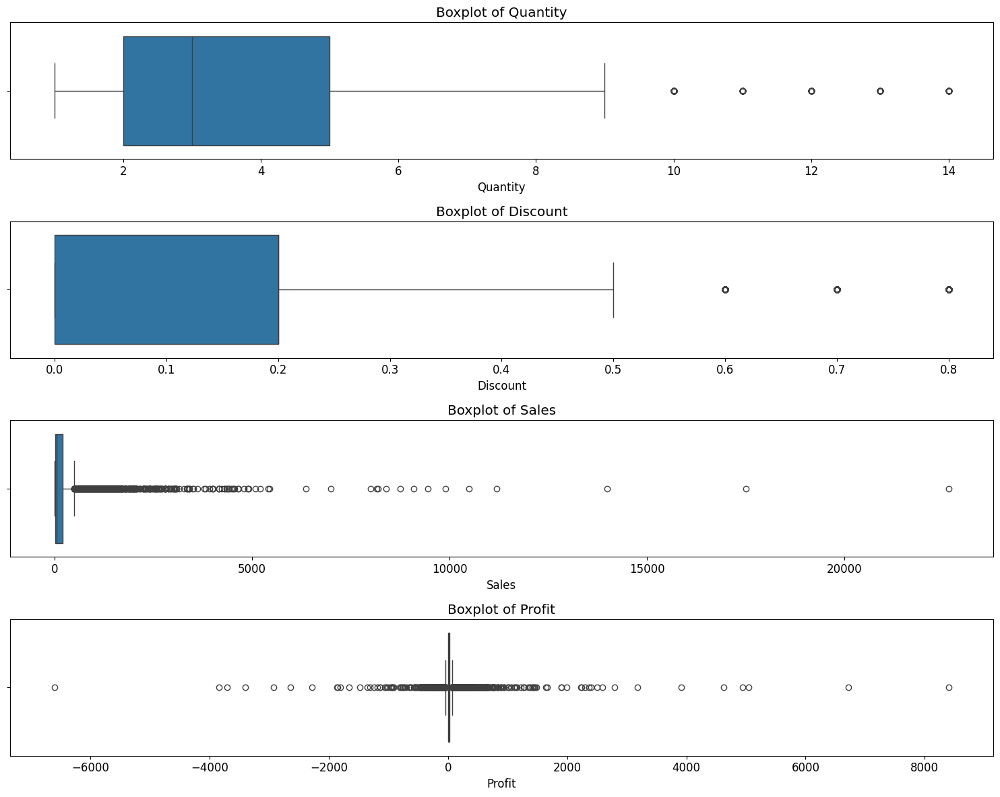

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of numerical columns
numerical_columns = ['Quantity', 'Discount','Sales','Profit']

# Set the figure size for better visualization
plt.figure(figsize=(15, 12))

# Plot boxplots for each numerical column
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 1, i)  # Adjust the subplot layout (2 rows, 2 columns)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


In [ ]:
df.drop('Row ID',axis = 1, inplace = True) #Dropping the Row ID column
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%m/%d/%Y') #convert Order dates to pandas datetime format
df['Ship Date'] = pd.to_datetime(df['Ship Date'], format='%m/%d/%Y')   #convert shipping dates to pandas datetime format

In [ ]:
#sorting data by order date
df.sort_values(by=['Order Date'], inplace=True, ascending=True)

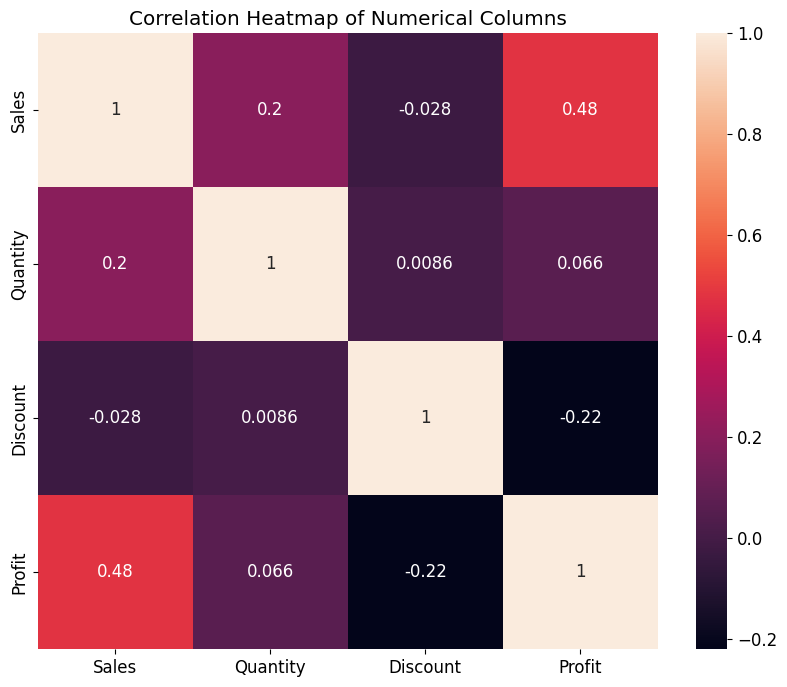

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numerical columns
numerical_columns = ['Sales', 'Quantity', 'Discount', 'Profit']

# Calculate the correlation matrix
corr_matrix = df[numerical_columns].corr()

# Set the figure size
plt.figure(figsize=(10, 8))

# Create a heatmap with annotations showing correlation values
sns.heatmap(corr_matrix, annot=True)

# Add a title
plt.title('Correlation Heatmap of Numerical Columns')

# Display the plot
plt.show()


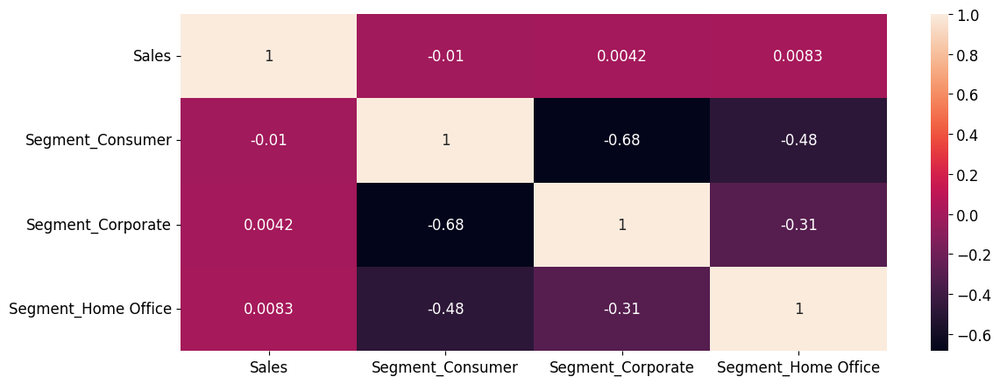

In [ ]:
# Correlation of features
df1 = df[['Segment','Sales']]
df_cat = pd.get_dummies(df1)
cor_mat = df_cat.corr()
sns.heatmap(data = cor_mat, annot = True);

In [ ]:
# summer break in usa beginning in mid-June and extending through late August or early September
# june,july,august,sep
# quarter 3: july august sep

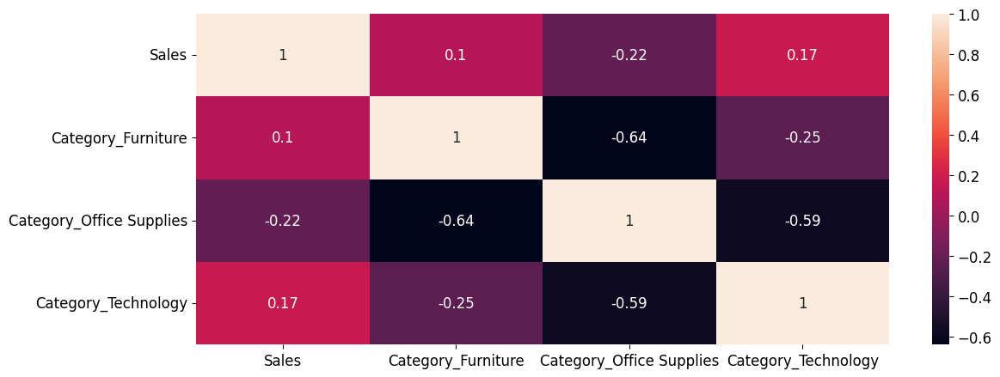

In [ ]:
df1 = df[['Category','Sales']]
df_cat = pd.get_dummies(df1)
cor_mat = df_cat.corr()
sns.heatmap(data = cor_mat, annot = True);

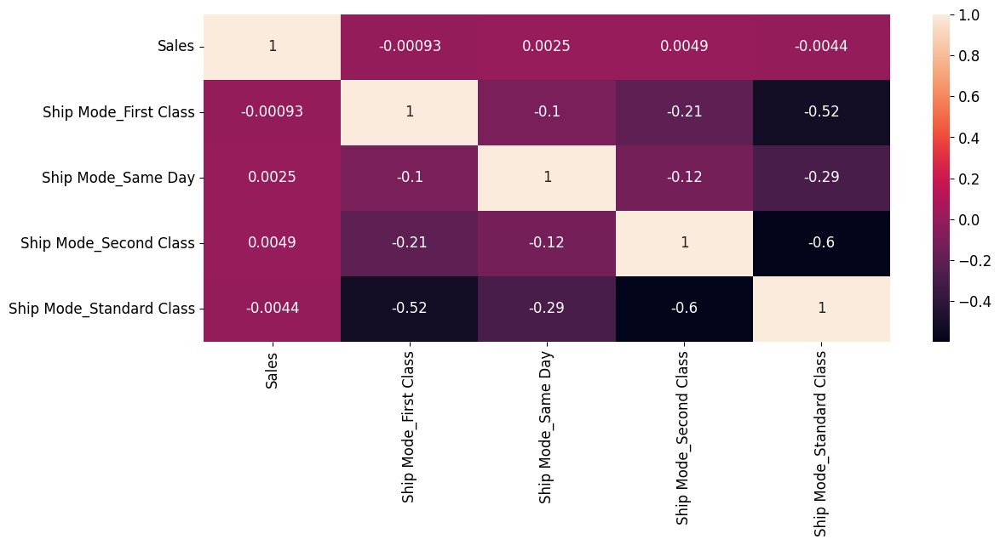

In [ ]:
df1 = df[['Ship Mode','Sales']]
df_cat = pd.get_dummies(df1)
cor_mat = df_cat.corr()
sns.heatmap(data = cor_mat, annot = True);

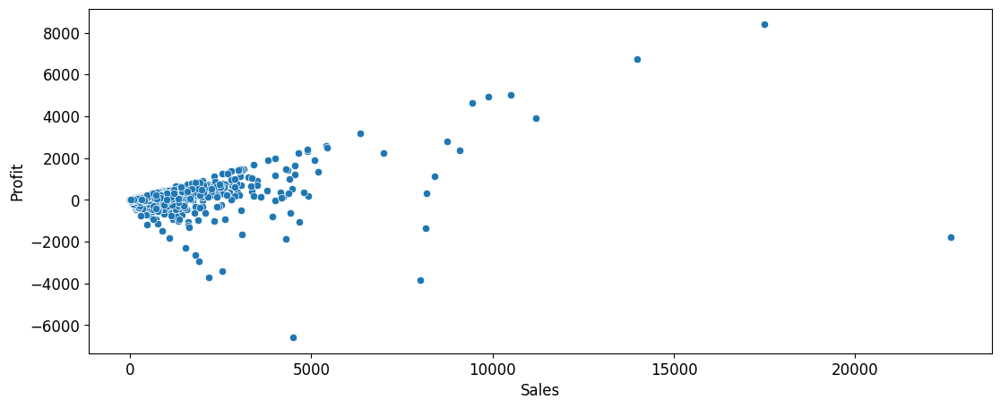

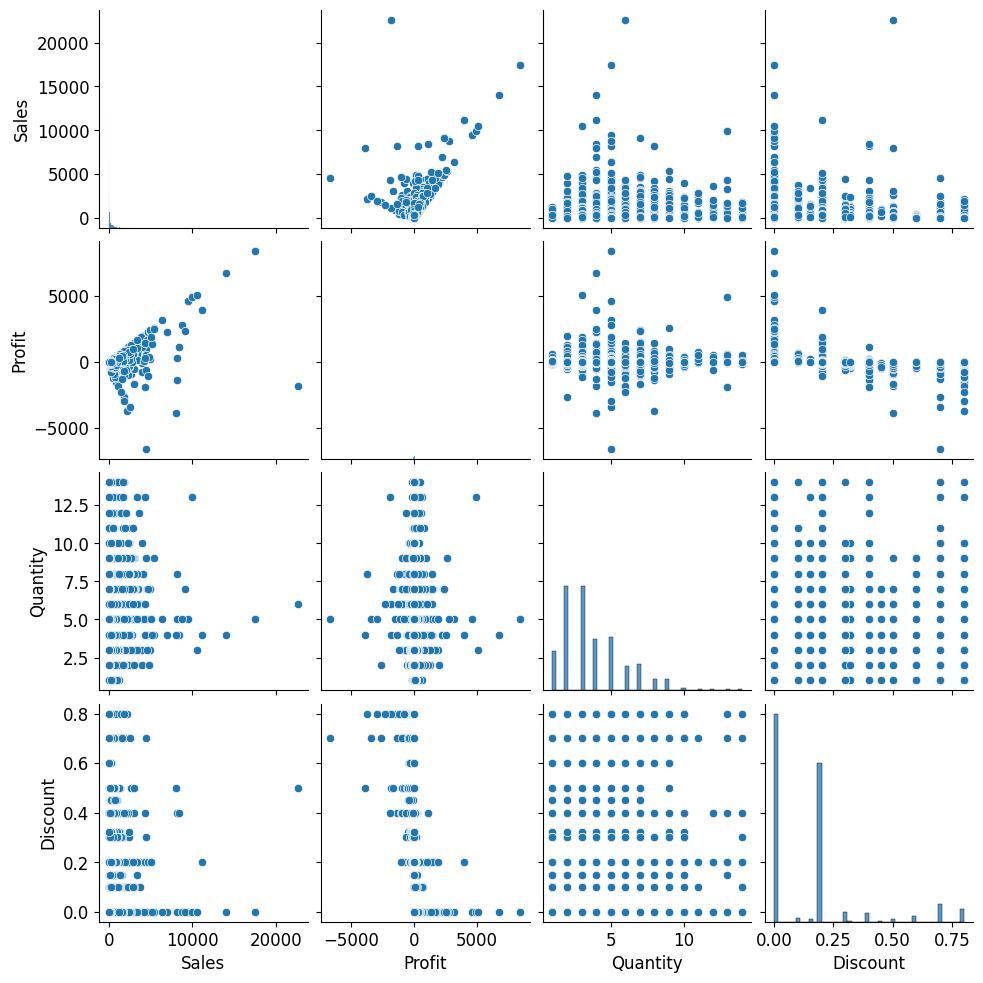

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot for two variables
sns.scatterplot(x='Sales', y='Profit', data=df)
plt.show()

# Pairplot for multiple features
sns.pairplot(df[['Sales', 'Profit', 'Quantity', 'Discount']])
plt.show()
# non linear data

In [ ]:
# Extract the year, month, day of the month, and weekday from the 'Order Date' column
df['Order_Year'] = df['Order Date'].dt.year
df['Order_Month'] = df['Order Date'].dt.month
df['Order_Day'] = df['Order Date'].dt.day
df['Order_Weekday'] = df['Order Date'].dt.weekday  # Weekday: Monday=0, Sunday=6


# Group the data by year and calculate total sales and profit
yearly_totals = df.groupby('Order_Year')[['Sales', 'Profit']].sum().reset_index()

# Initialize columns for percentage increase
yearly_totals['Sales % Increase'] = 0.0
yearly_totals['Profit % Increase'] = 0.0

# Loop through the data to calculate percentage increase using custom formula
for i in range(1, len(yearly_totals)):
    # Sales percentage increase
    previous_sales = yearly_totals['Sales'].iloc[i - 1]
    current_sales = yearly_totals['Sales'].iloc[i]
    yearly_totals.loc[i, 'Sales % Increase'] = ((current_sales - previous_sales) / previous_sales) * 100

    # Profit percentage increase
    previous_profit = yearly_totals['Profit'].iloc[i - 1]
    current_profit = yearly_totals['Profit'].iloc[i]
    yearly_totals.loc[i, 'Profit % Increase'] = ((current_profit - previous_profit) / previous_profit) * 100


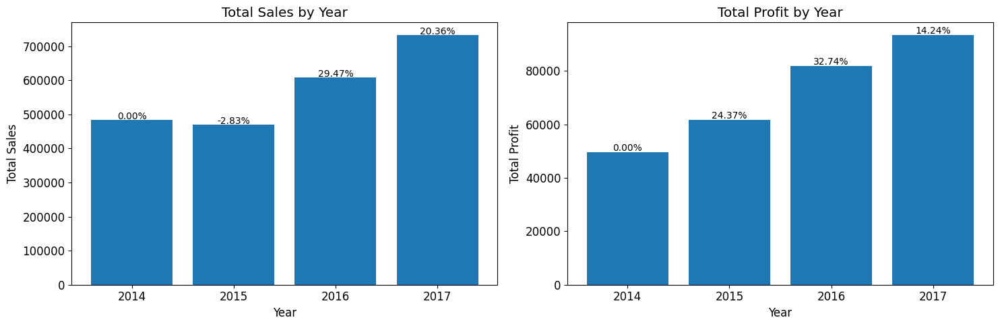

In [ ]:
# Total sales and profit by year
import matplotlib.pyplot as plt

# Set the figure size and layout for two subplots (1 row, 2 columns)
plt.figure(figsize=(15,5))

# First subplot: Total Sales by Year
plt.subplot(1, 2, 1)  # (rows, columns, index of the plot)
bars_sales = plt.bar(yearly_totals['Order_Year'], yearly_totals['Sales'])
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.title('Total Sales by Year')
plt.xticks(yearly_totals['Order_Year'])

# Annotating Sales % Increase on top of bars
for i, bar in enumerate(bars_sales):
    sales_increase = yearly_totals['Sales % Increase'].iloc[i]
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 2000, f'{sales_increase:.2f}%',
             horizontalalignment='center', fontsize=10)

# Second subplot: Total Profit by Year
plt.subplot(1, 2, 2)  # (rows, columns, index of the plot)
bars_profit = plt.bar(yearly_totals['Order_Year'], yearly_totals['Profit'])
plt.xlabel('Year')
plt.ylabel('Total Profit')
plt.title('Total Profit by Year')
plt.xticks(yearly_totals['Order_Year'])

# Annotating Profit % Increase on top of bars
for i, bar in enumerate(bars_profit):
  profit_increase = yearly_totals['Profit % Increase'].iloc[i]
  plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 500, f'{profit_increase:.2f}%',
             horizontalalignment='center', fontsize=10)


# Show the plots
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()
# Average increase in sales = 15.6%
# Average increase in profit = 23.8%


In [ ]:
# Seasonality
# Ensure 'Order Date' is set as the index and is of datetime type
df = df.set_index('Order Date')

<ipython-input-569-706730fa3091>:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_sales = df.resample('Y')['Sales'].sum()  # Resample by year and sum the sales


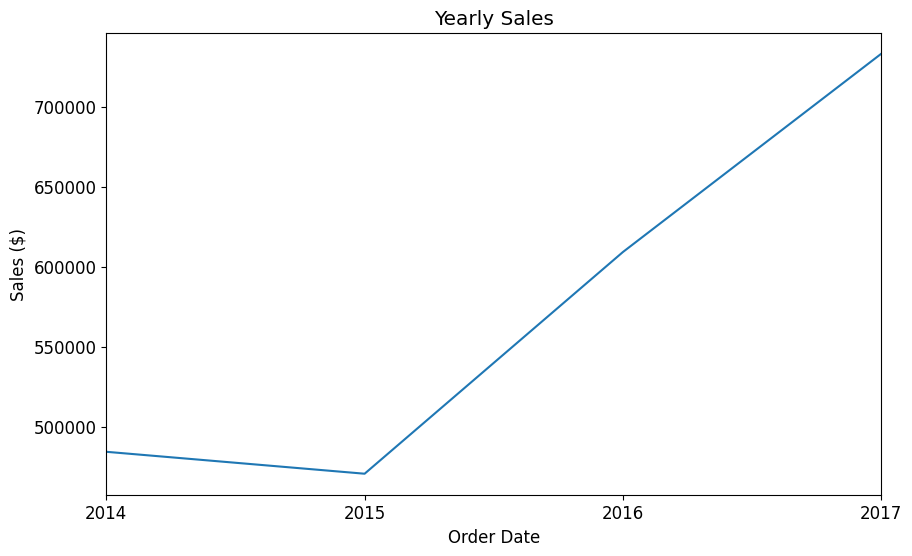

In [ ]:
# Yearly sales
yearly_sales = df.resample('Y')['Sales'].sum()  # Resample by year and sum the sales
yearly_sales.plot(title='Yearly Sales', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.show()
# Sales decreased slightly in 2015, but have been increasing since then

<ipython-input-570-501a9bcd4f83>:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_profit = df.resample('Y')['Profit'].sum()  # Resample by year and sum the profit


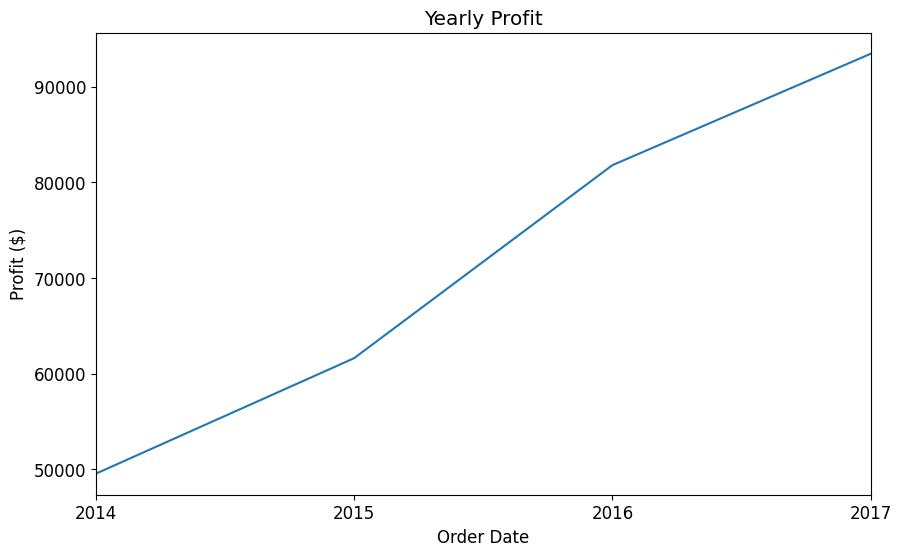

In [ ]:
# Yearly profit
yearly_profit = df.resample('Y')['Profit'].sum()  # Resample by year and sum the profit
yearly_profit.plot(title='Yearly Profit', figsize=(10,6))
plt.ylabel('Profit ($)')
plt.show()
# Profit is increasing through out

<ipython-input-571-c939e291f2f7>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales_2014 = sales_2014.resample('M')['Sales'].sum()


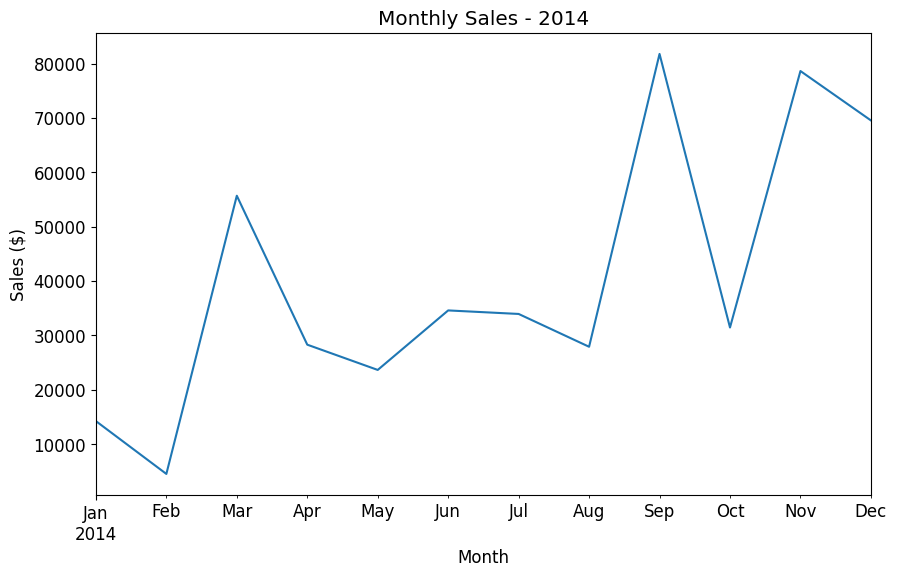

In [ ]:
# Filter data for 2014
sales_2014 = df.loc[df.index.year == 2014]

# Resample by month for 2014
monthly_sales_2014 = sales_2014.resample('M')['Sales'].sum()

# Plot
monthly_sales_2014.plot(title='Monthly Sales - 2014', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.xlabel('Month')
plt.show()
# Less sales at start of year more sales at end of year


<ipython-input-572-28052cf4866f>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales_2015 = sales_2015.resample('M')['Sales'].sum()


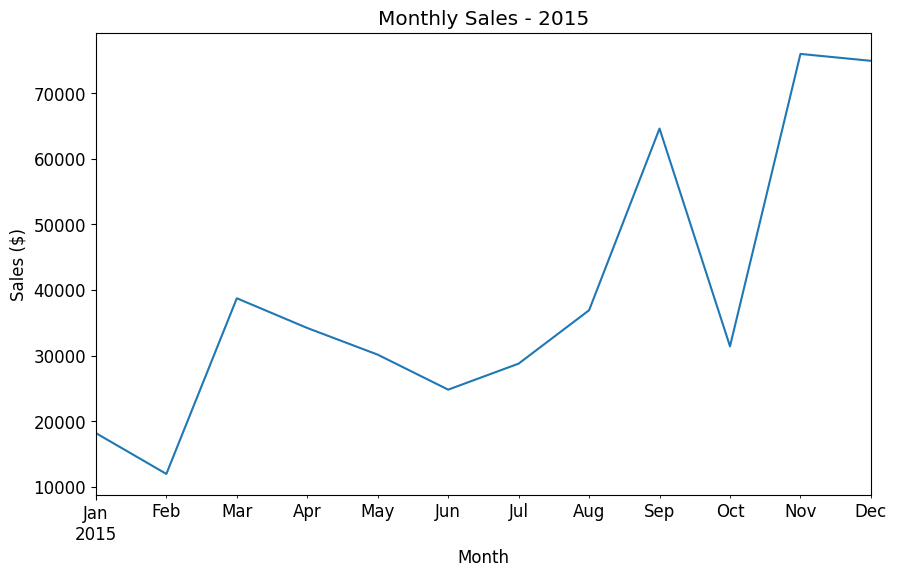

In [ ]:
# Filter data for 2015
sales_2015 = df.loc[df.index.year == 2015]

# Resample by month for 2015
monthly_sales_2015 = sales_2015.resample('M')['Sales'].sum()

# Plot
monthly_sales_2015.plot(title='Monthly Sales - 2015', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.xlabel('Month')
plt.show()
# Less sales at start of year more sales at end of year

<ipython-input-573-6fb12e8aebf2>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales_2016 = sales_2016.resample('M')['Sales'].sum()


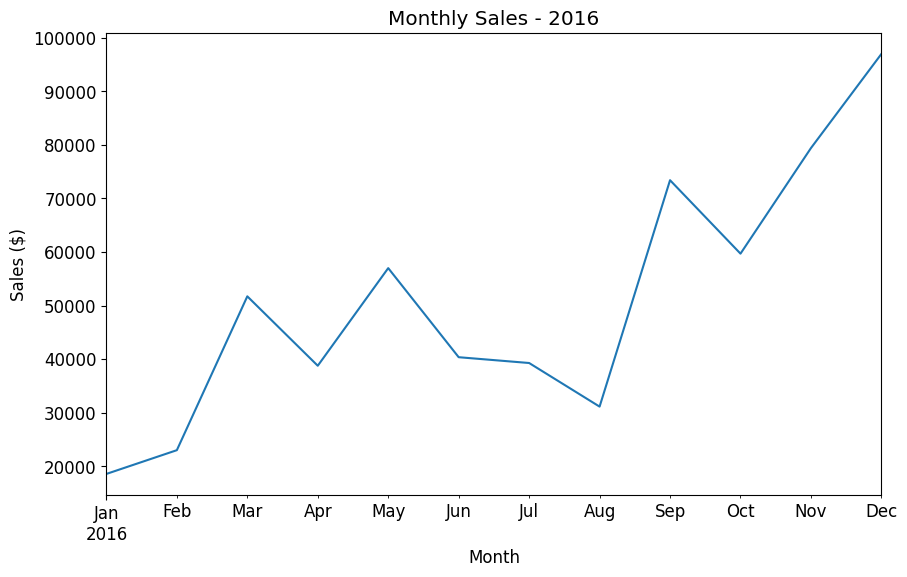

In [ ]:
# Filter data for 2016
sales_2016 = df.loc[df.index.year == 2016]

# Resample by month for 2016
monthly_sales_2016 = sales_2016.resample('M')['Sales'].sum()

# Plot
monthly_sales_2016.plot(title='Monthly Sales - 2016', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.xlabel('Month')
plt.show()
# Less sales at start of year more sales at end of year

<ipython-input-574-45eb9e92314e>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales_2017 = sales_2017.resample('M')['Sales'].sum()


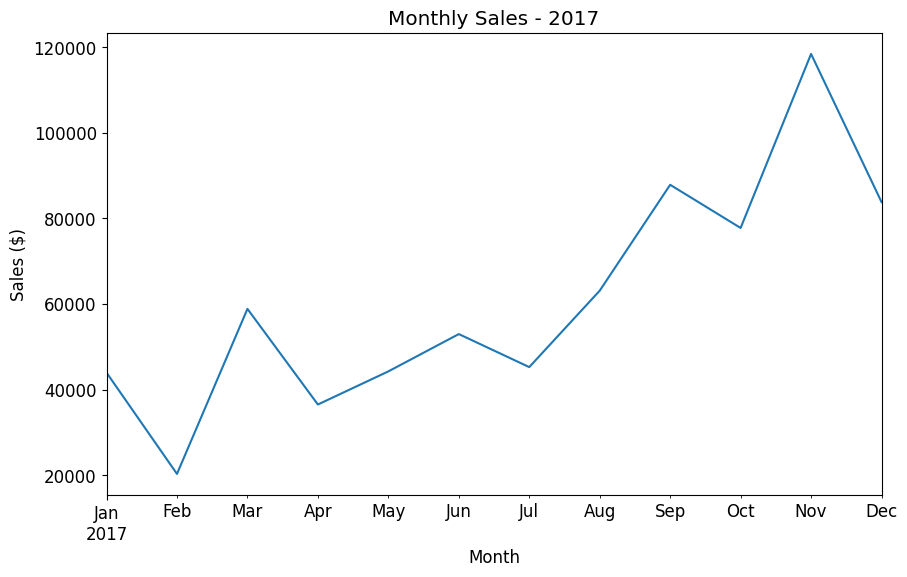

In [ ]:
# Filter data for 2017
sales_2017 = df.loc[df.index.year == 2017]

# Resample by month for 2017
monthly_sales_2017 = sales_2017.resample('M')['Sales'].sum()

# Plot
monthly_sales_2017.plot(title='Monthly Sales - 2017', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.xlabel('Month')
plt.show()
# Less sales at start of year more sales at end of year

<ipython-input-575-706730fa3091>:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_sales = df.resample('Y')['Sales'].sum()  # Resample by year and sum the sales


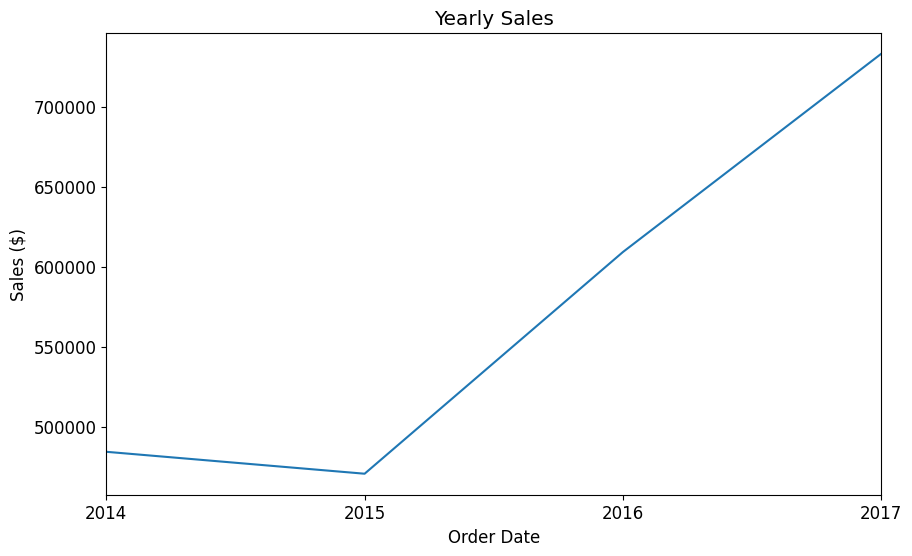

In [ ]:
# Yearly sales
yearly_sales = df.resample('Y')['Sales'].sum()  # Resample by year and sum the sales
yearly_sales.plot(title='Yearly Sales', figsize=(10,6))
plt.ylabel('Sales ($)')
plt.show()
# Sales decreased slightly in 2015, but have been increasing since then

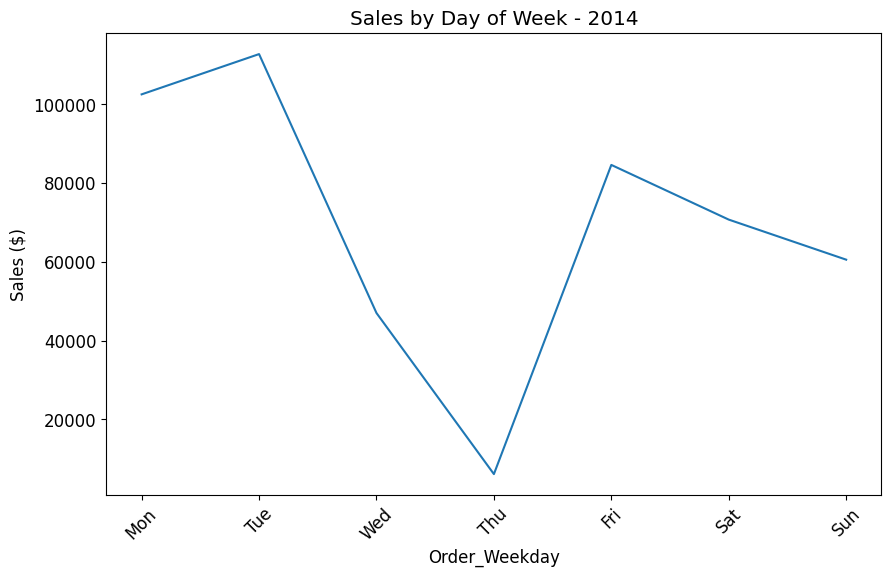

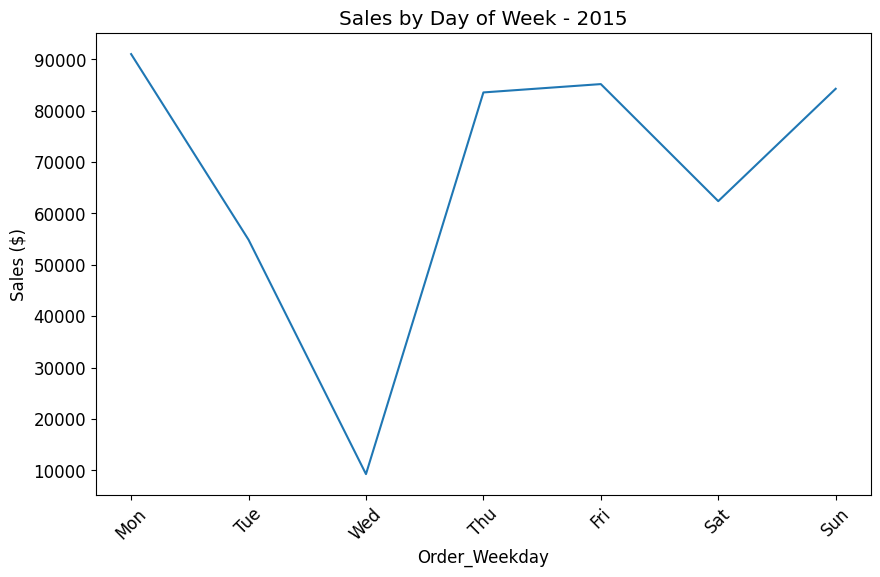

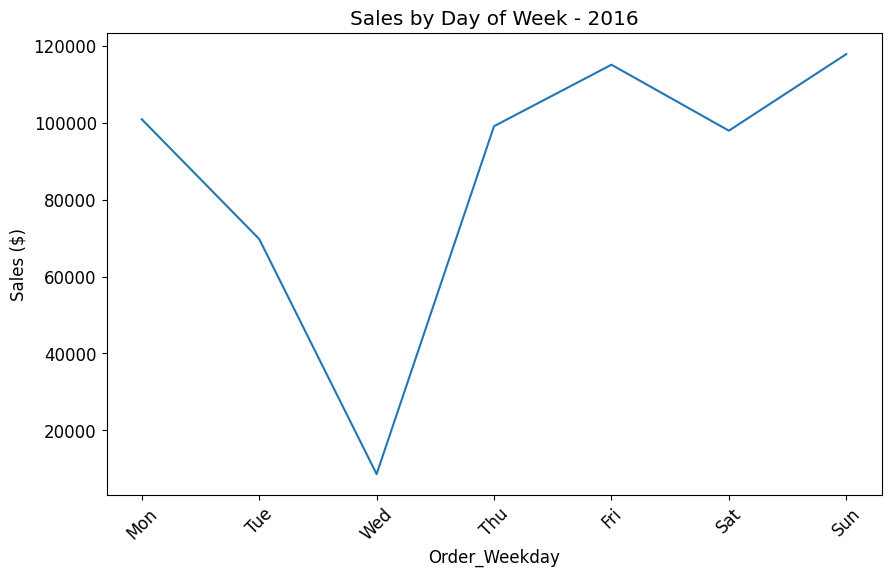

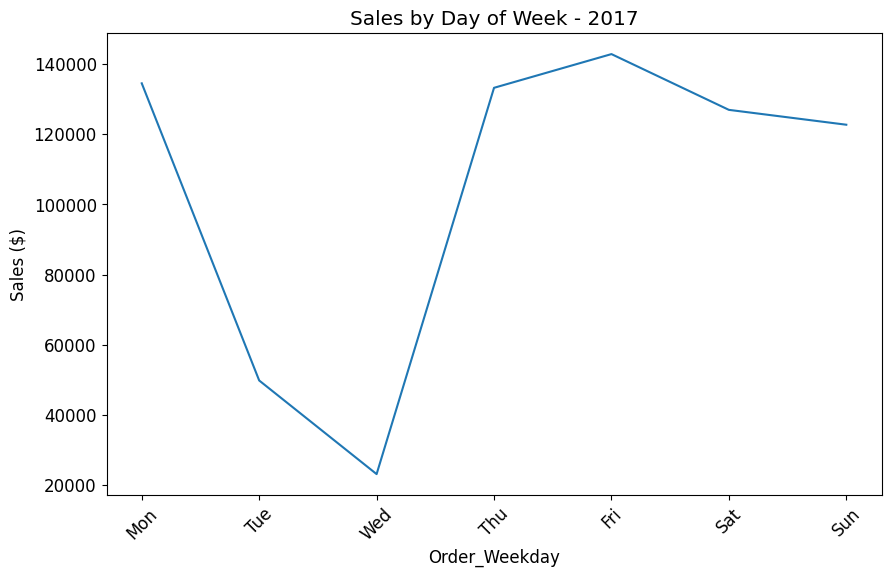

In [ ]:
# Sales by day of the week
for year in [2014, 2015, 2016, 2017]:
    # Filter data for the specific year
    sales_year = df[df.index.year == year]

    # Group by day of the week
    daily_sales = sales_year.groupby('Order_Weekday')['Sales'].sum()

    # Plot sales by day of the week for the specific year
    daily_sales.plot(title=f'Sales by Day of Week - {year}', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)
    plt.show()
    # More Sales at start and end of week


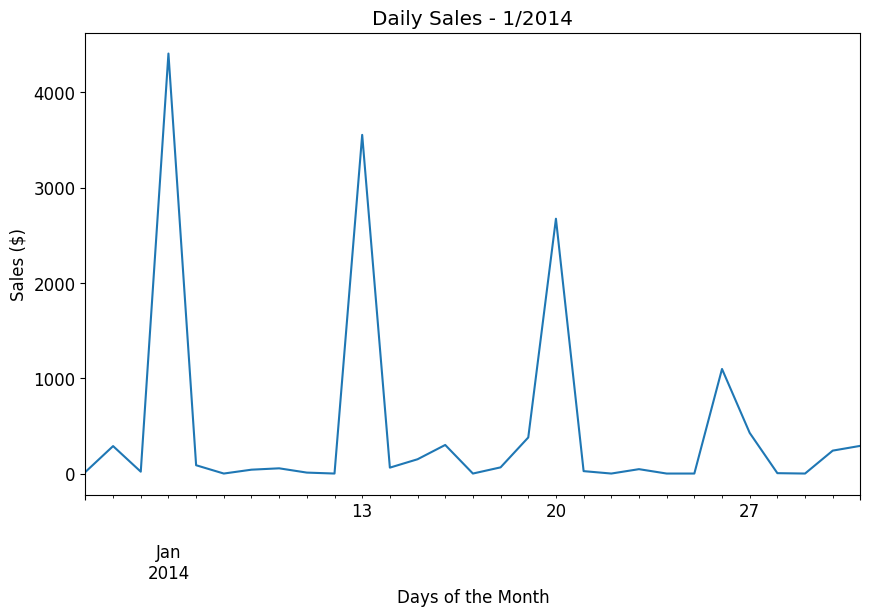

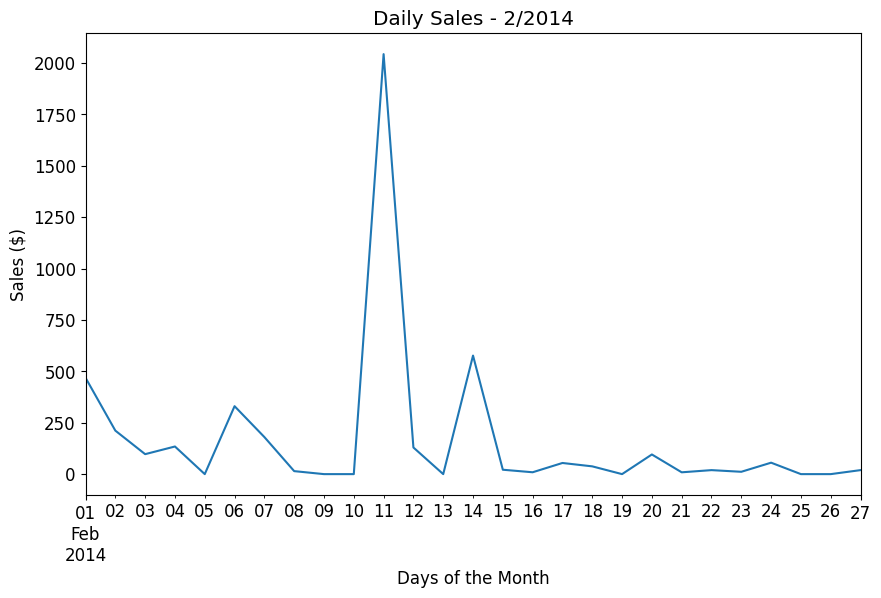

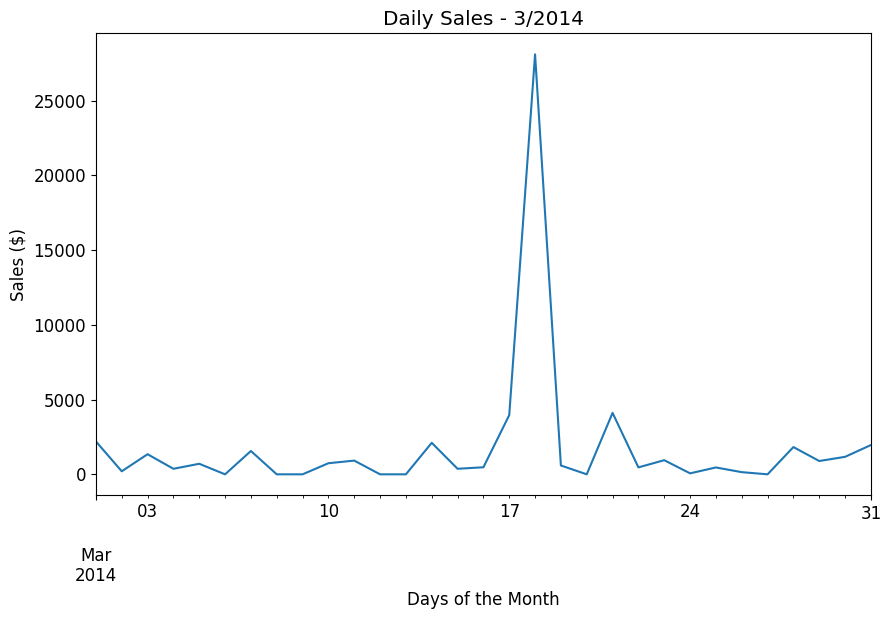

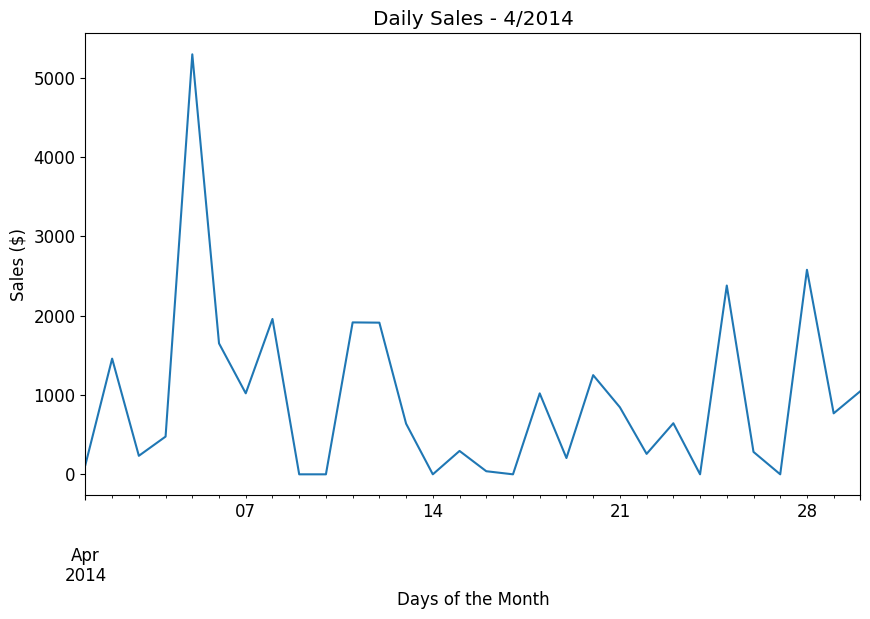

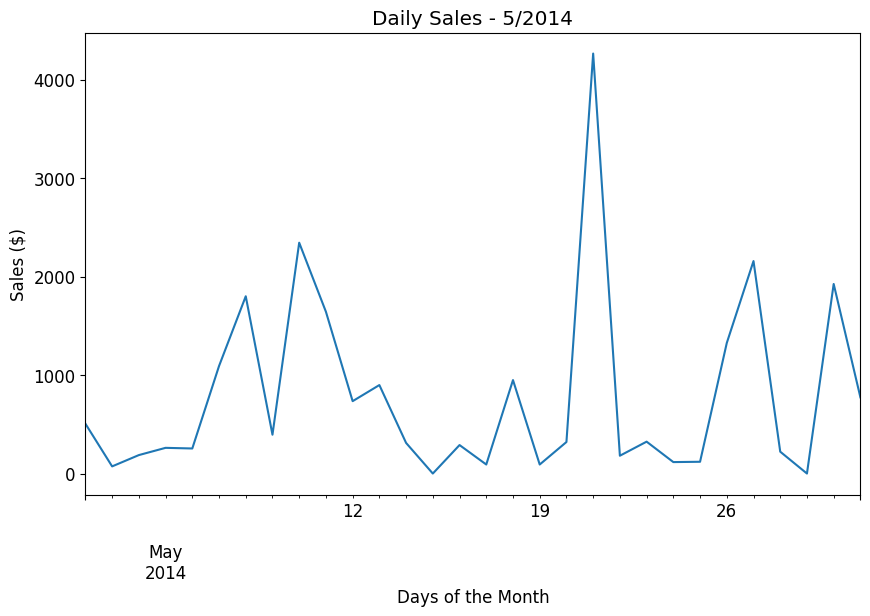

...

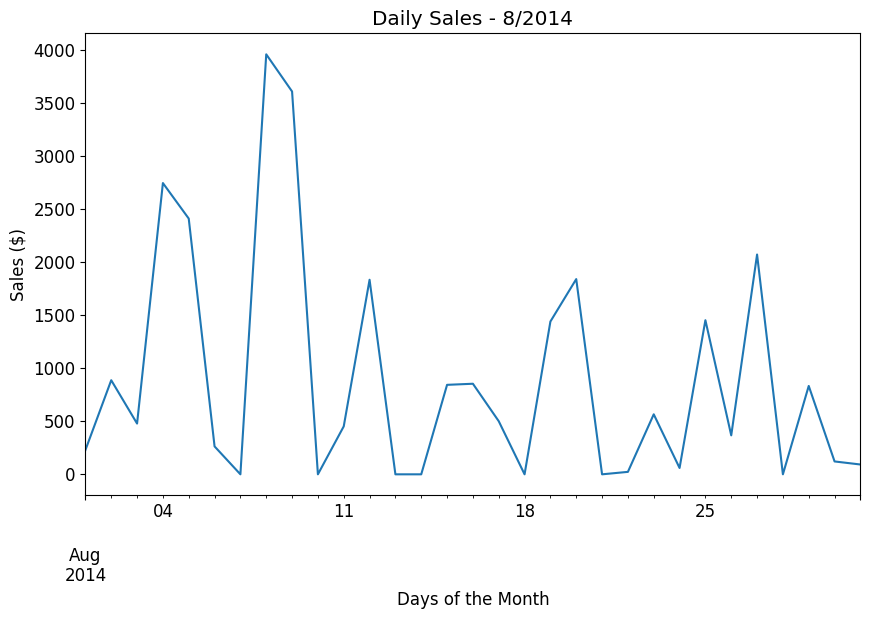

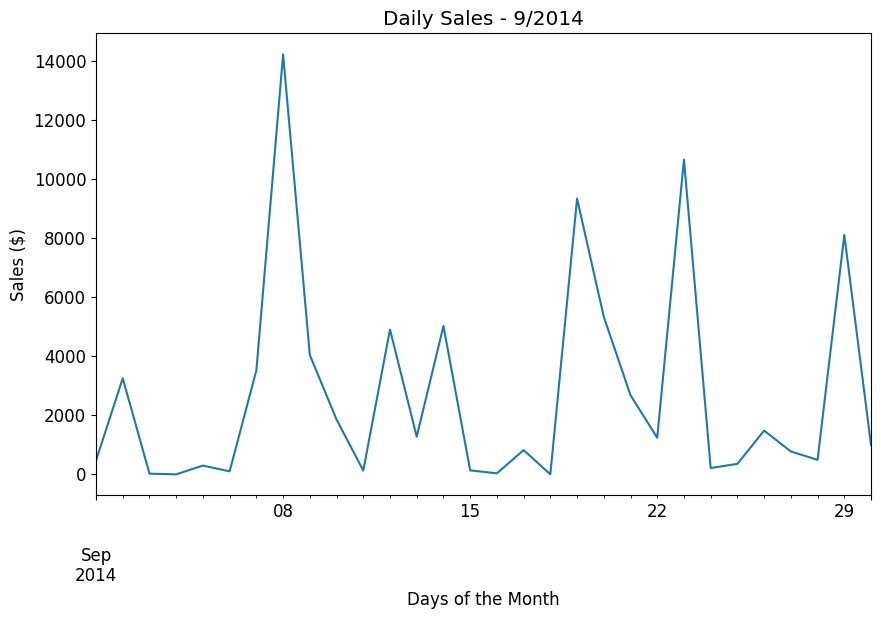

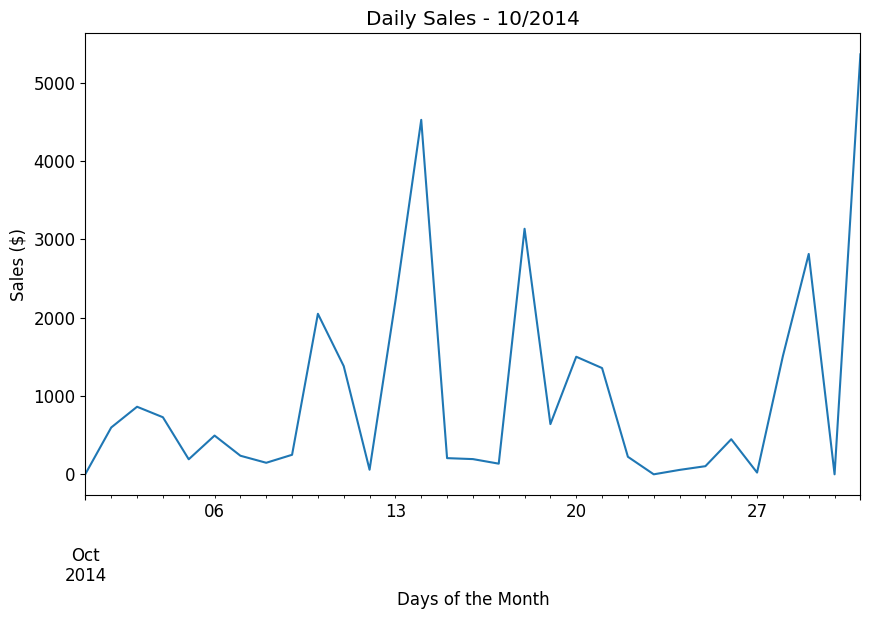

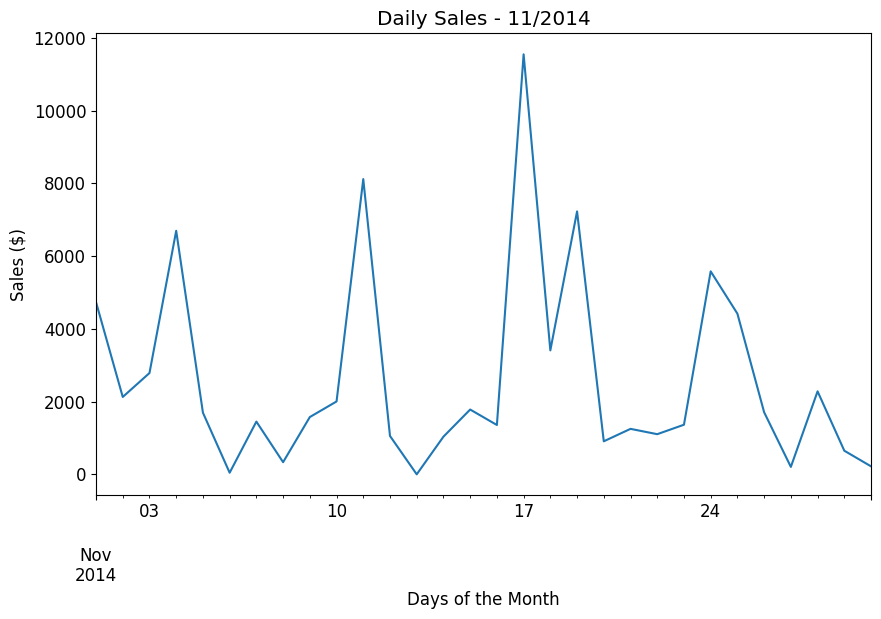

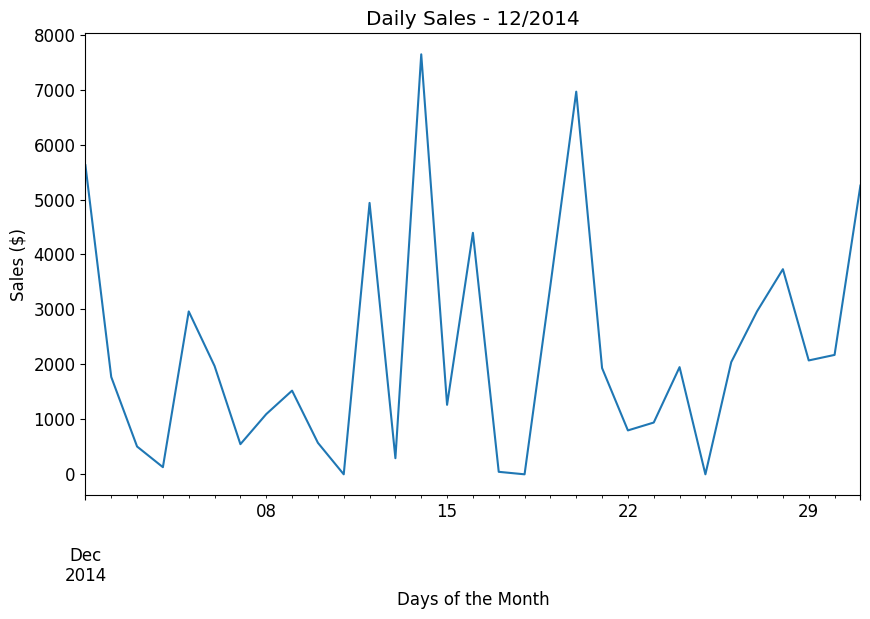

In [ ]:
# Filter data for 2014
sales_2014 = df.loc[df.index.year == 2014]

# Group by month
months_2014 = sales_2014.groupby(sales_2014.index.month)

# Plot daily sales for each month
for month, data in months_2014:
    daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
    daily_sales.plot(title=f'Daily Sales - {month}/2014', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xlabel('Days of the Month')
    plt.show()


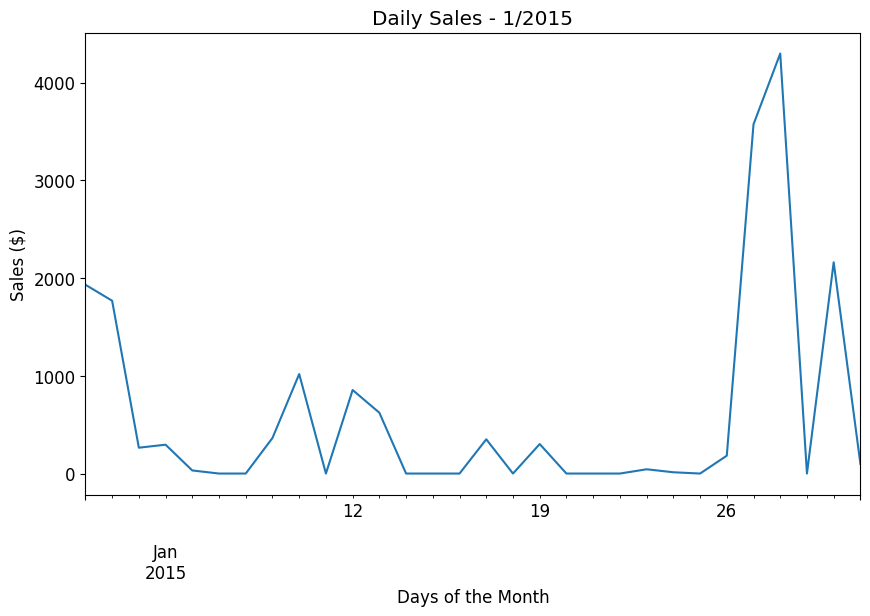

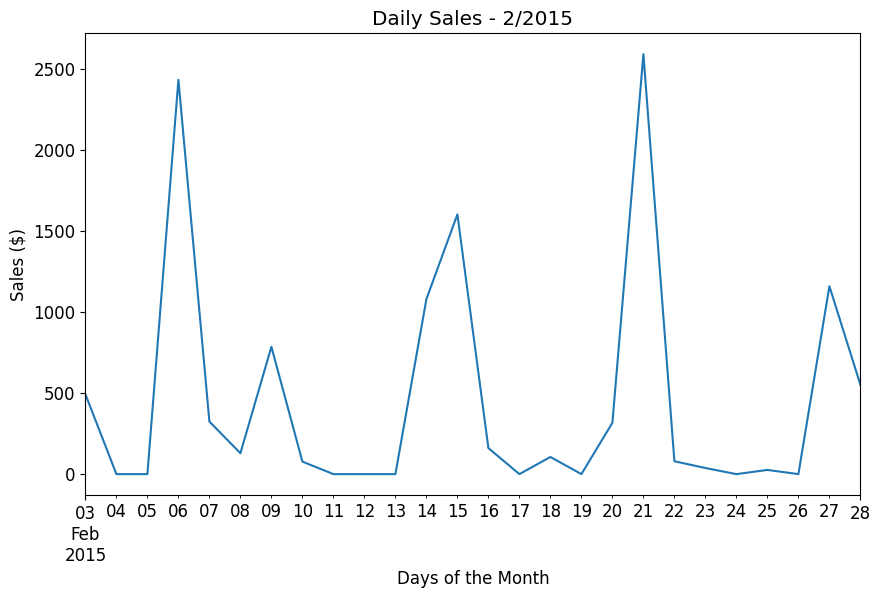

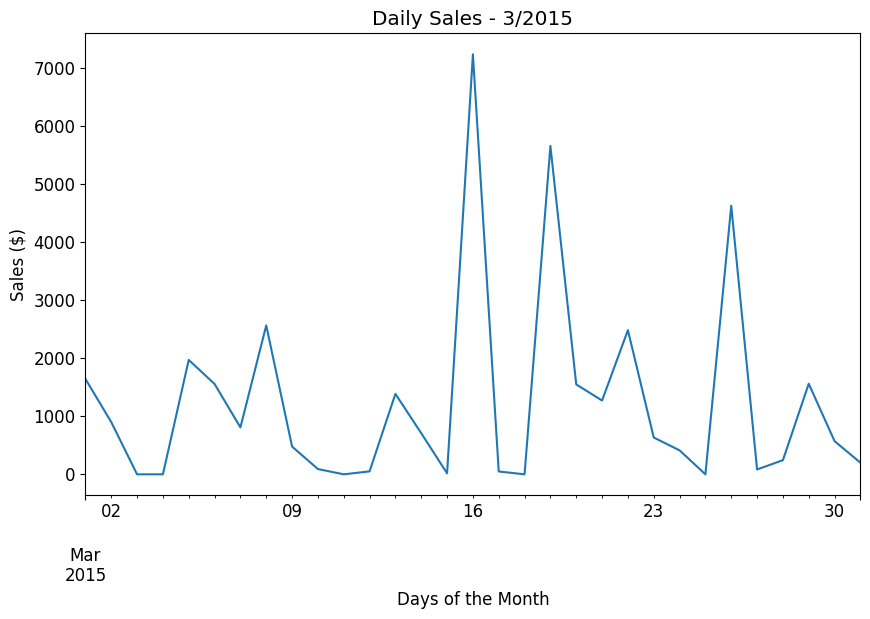

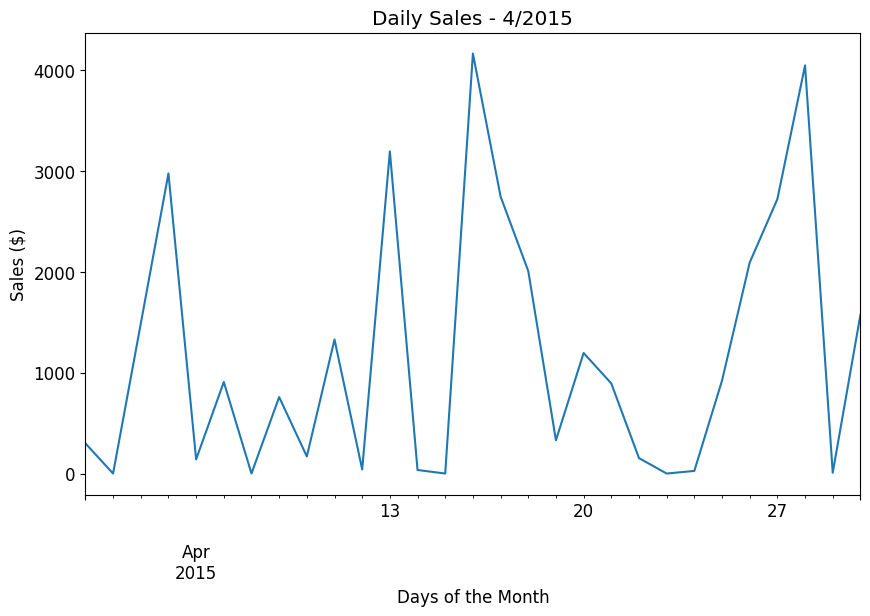

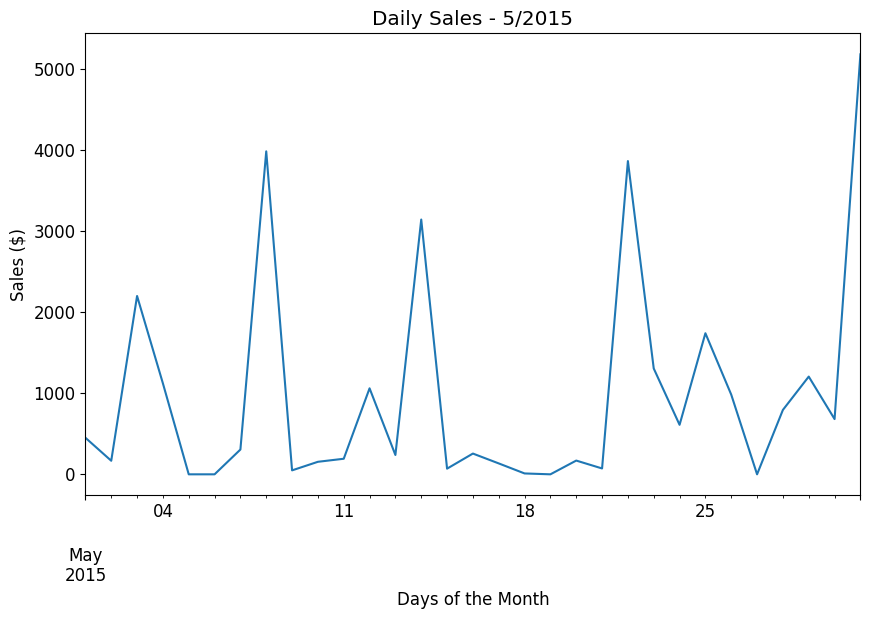

...

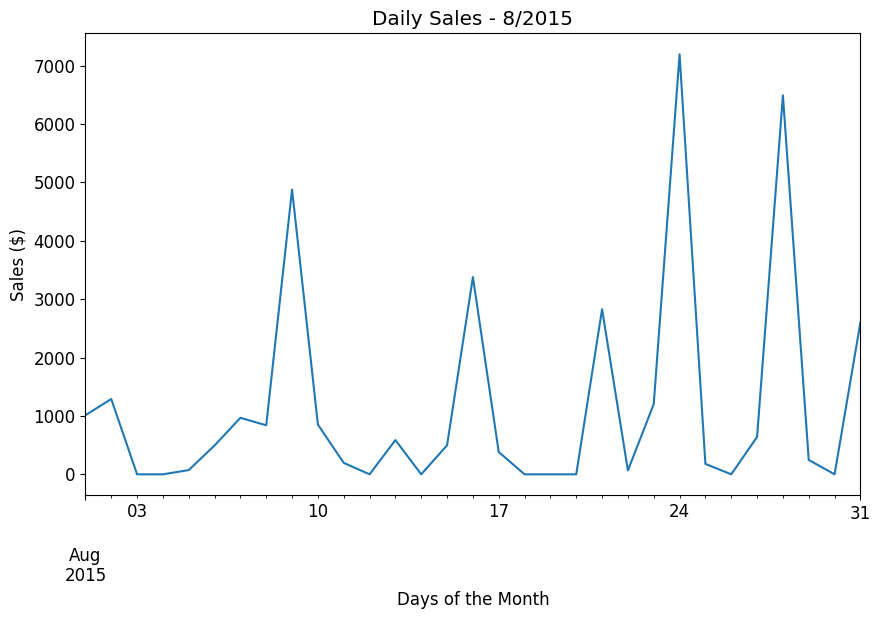

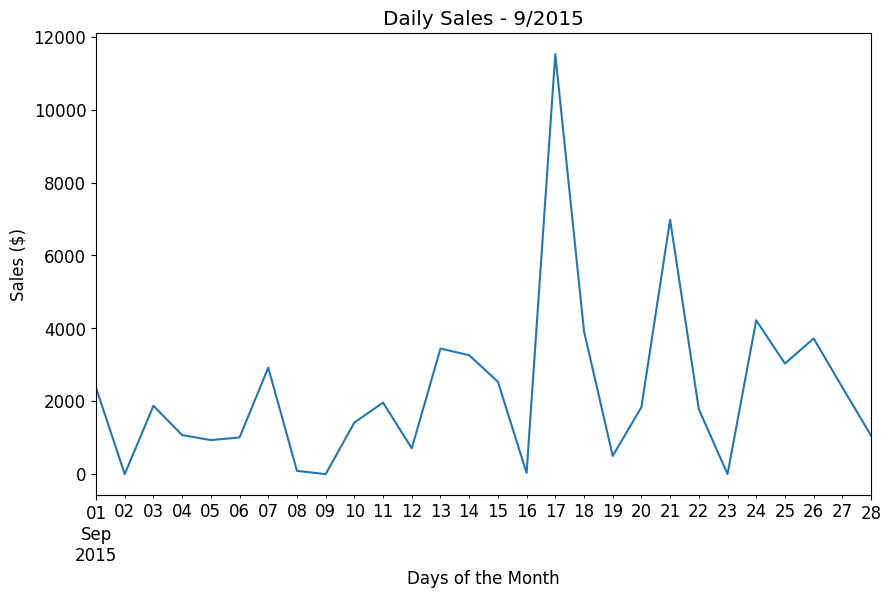

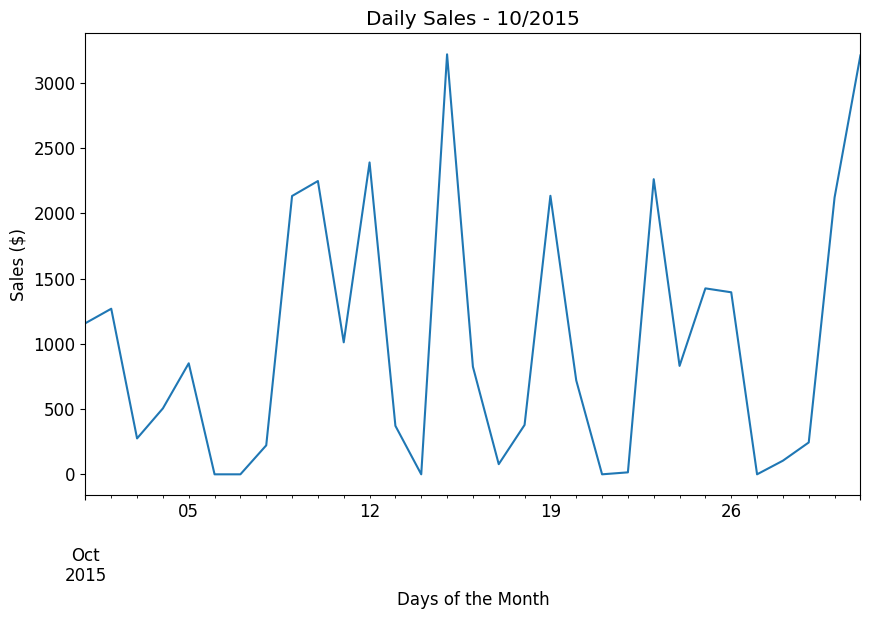

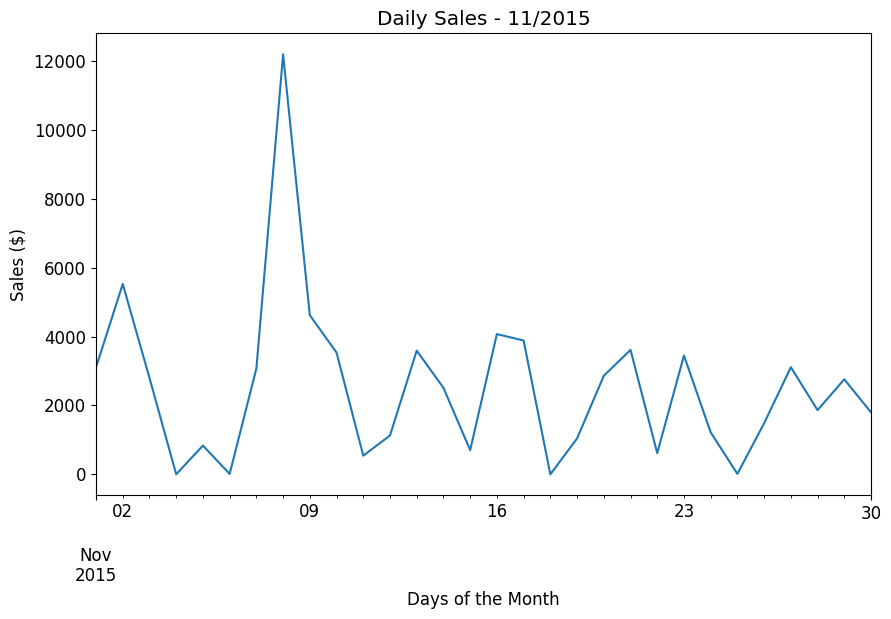

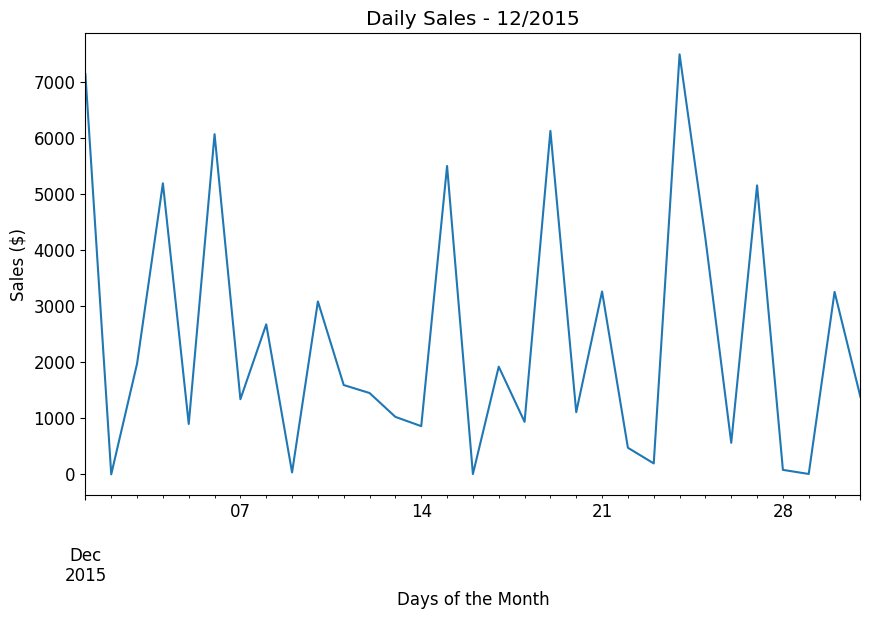

In [ ]:
# Filter data for 2015
sales_2015 = df.loc[df.index.year == 2015]

# Group by month
months_2015 = sales_2015.groupby(sales_2015.index.month)

# Plot daily sales for each month
for month, data in months_2015:
    daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
    daily_sales.plot(title=f'Daily Sales - {month}/2015', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xlabel('Days of the Month')
    plt.show()


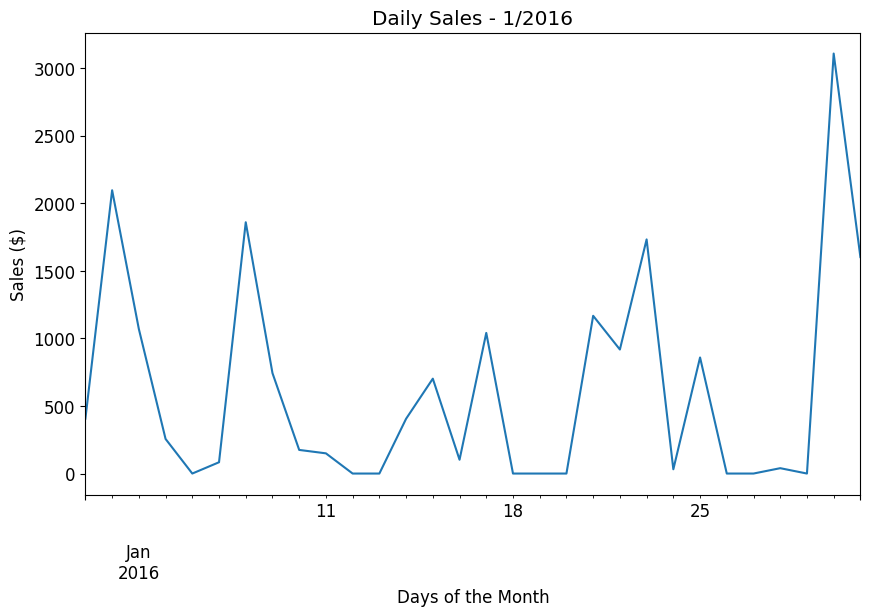

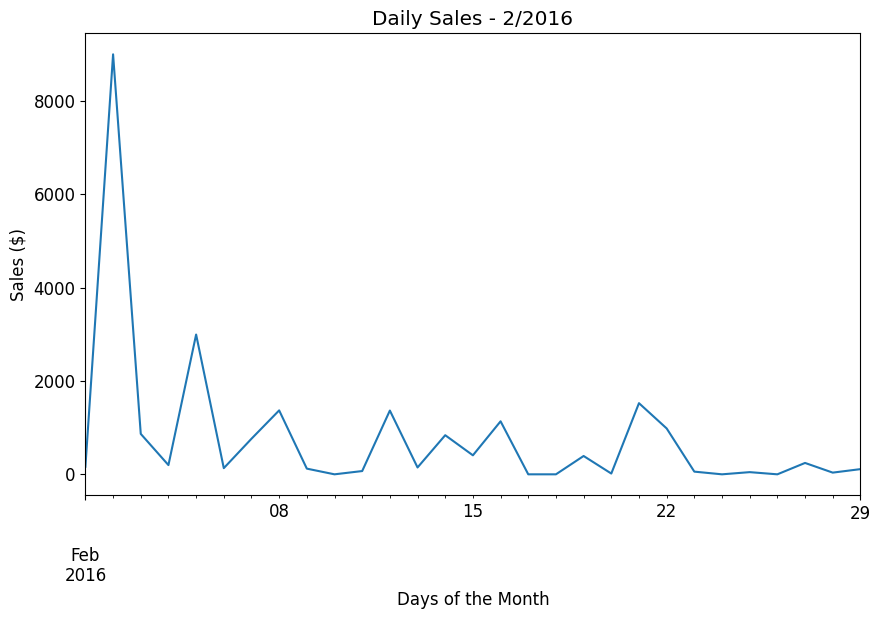

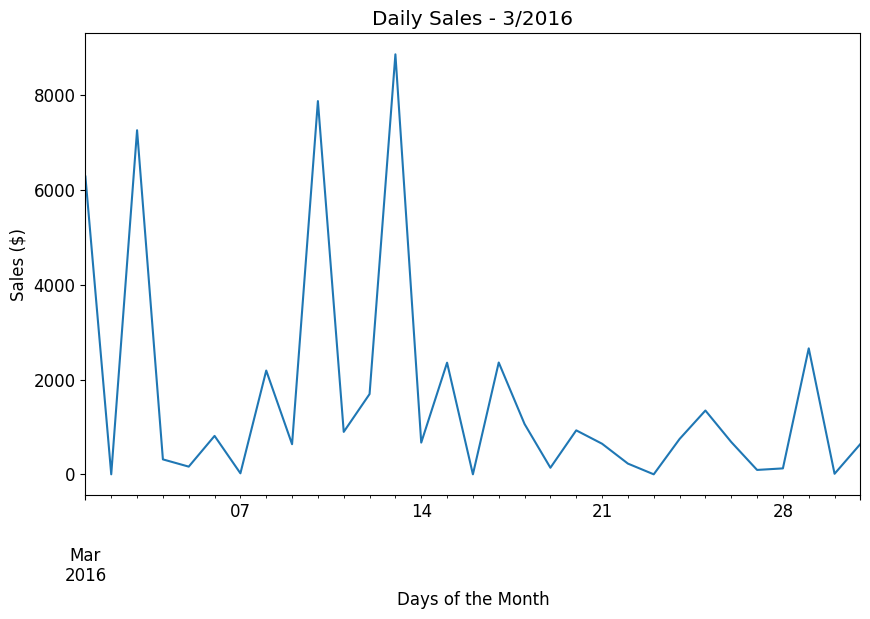

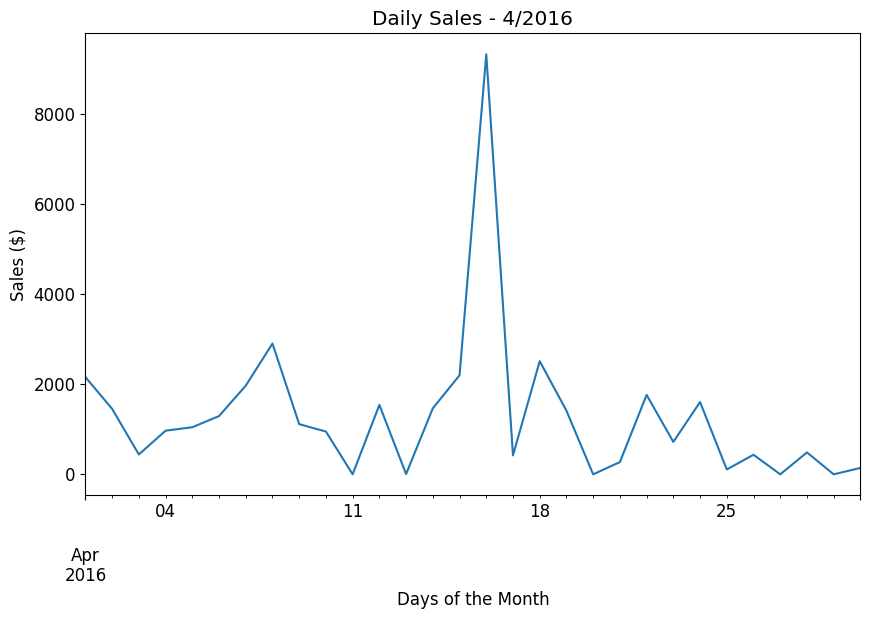

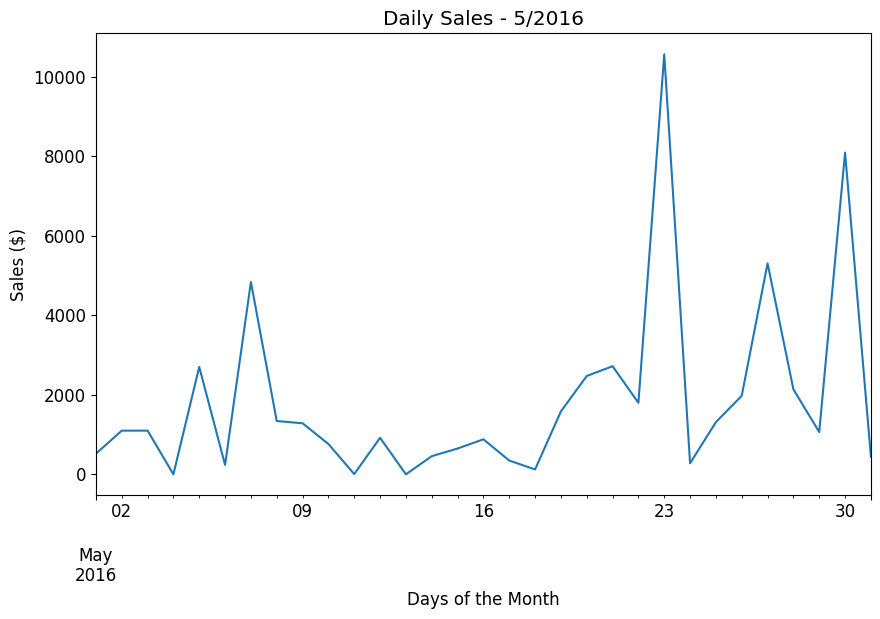

...

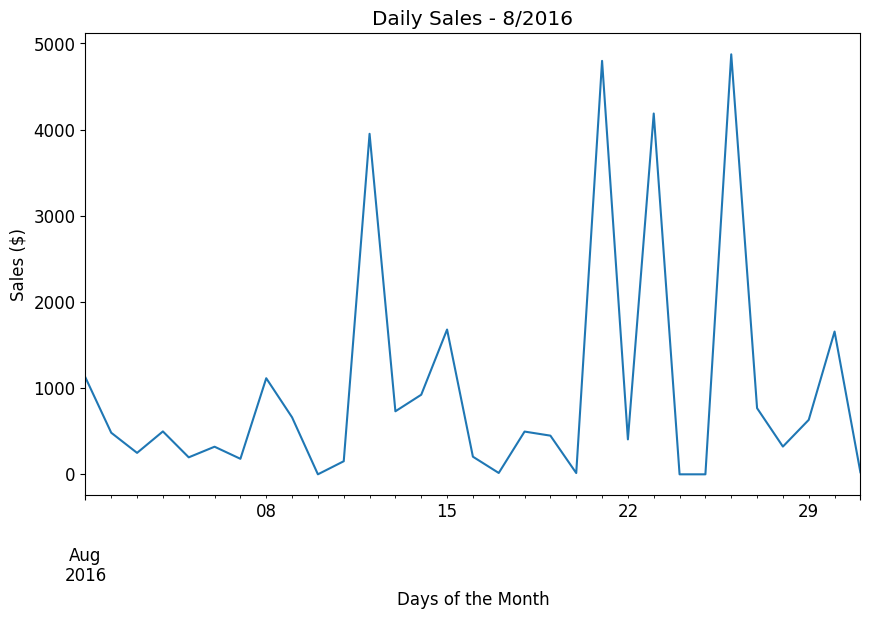

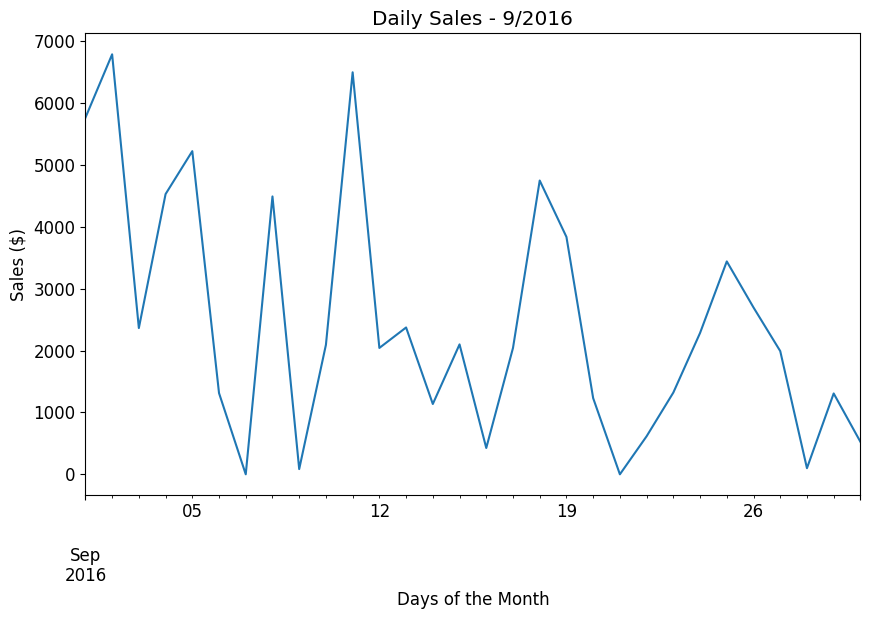

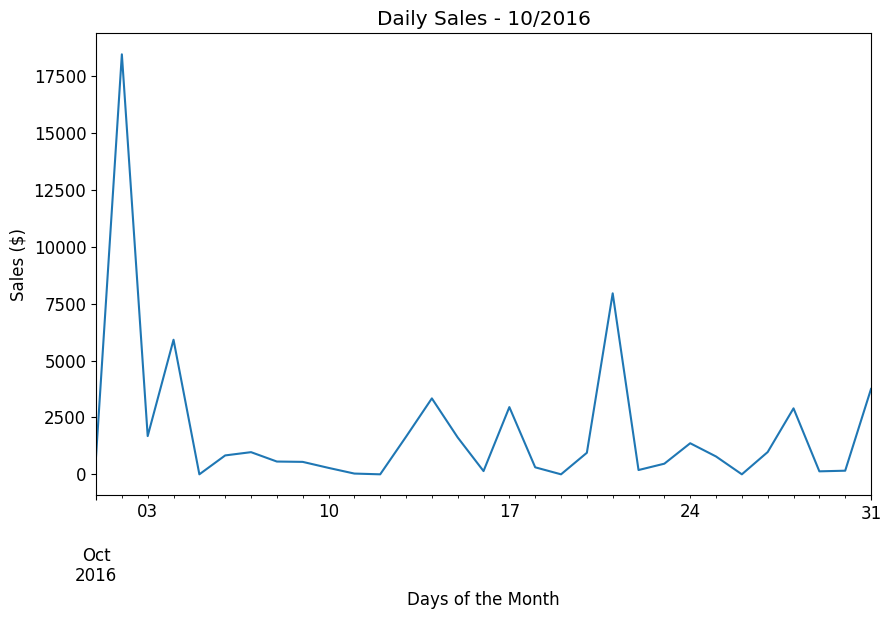

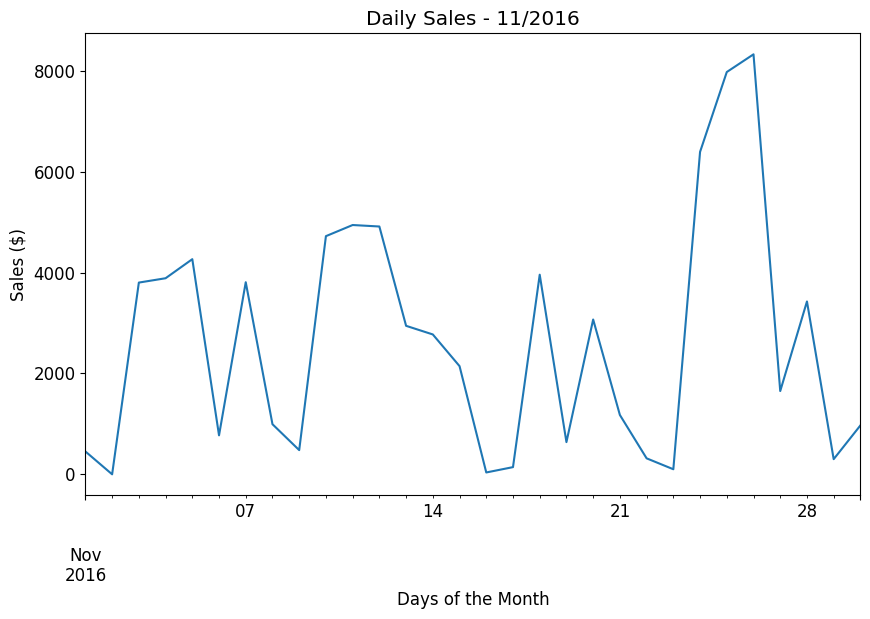

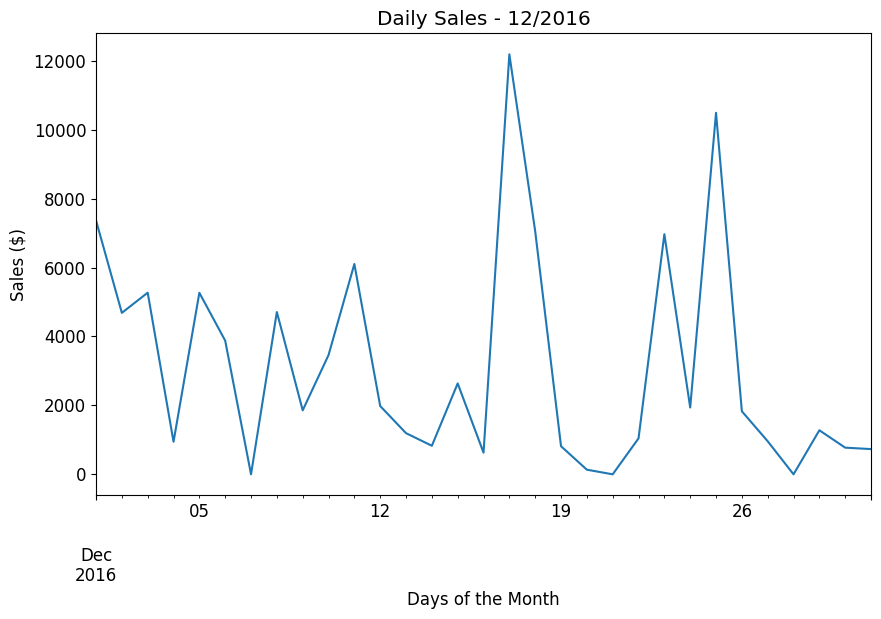

In [ ]:
# Filter data for 2016
sales_2016 = df.loc[df.index.year == 2016]

# Group by month
months_2016 = sales_2016.groupby(sales_2016.index.month)

# Plot daily sales for each month
for month, data in months_2016:
    daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
    daily_sales.plot(title=f'Daily Sales - {month}/2016', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xlabel('Days of the Month')
    plt.show()


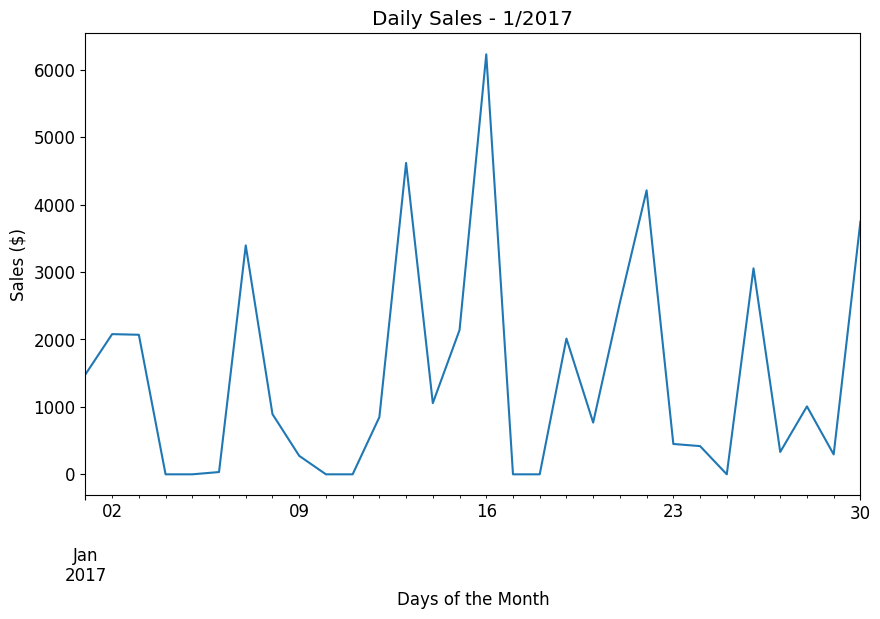

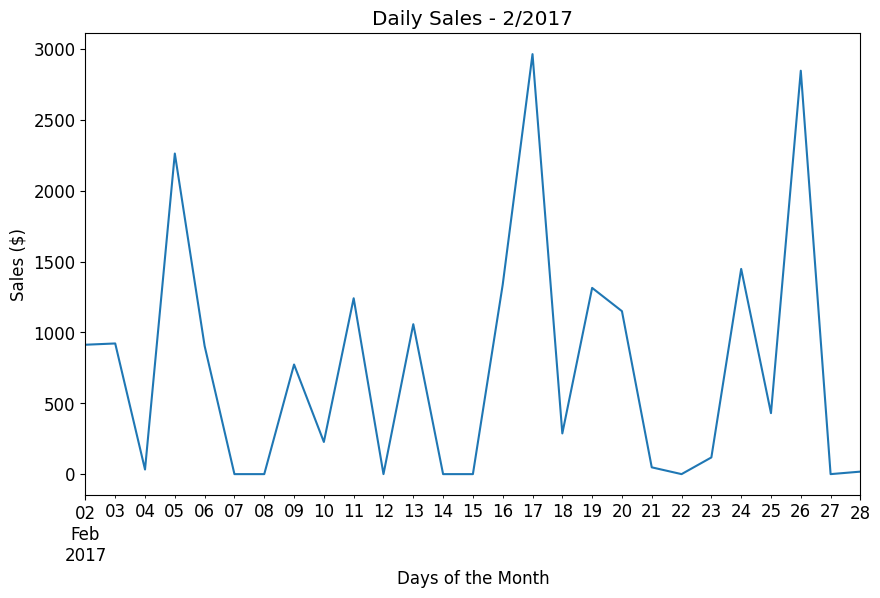

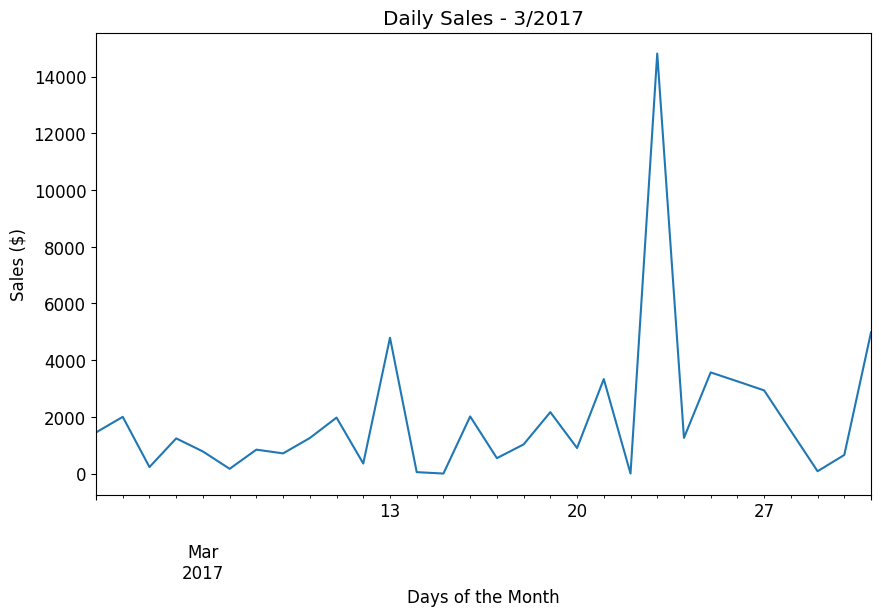

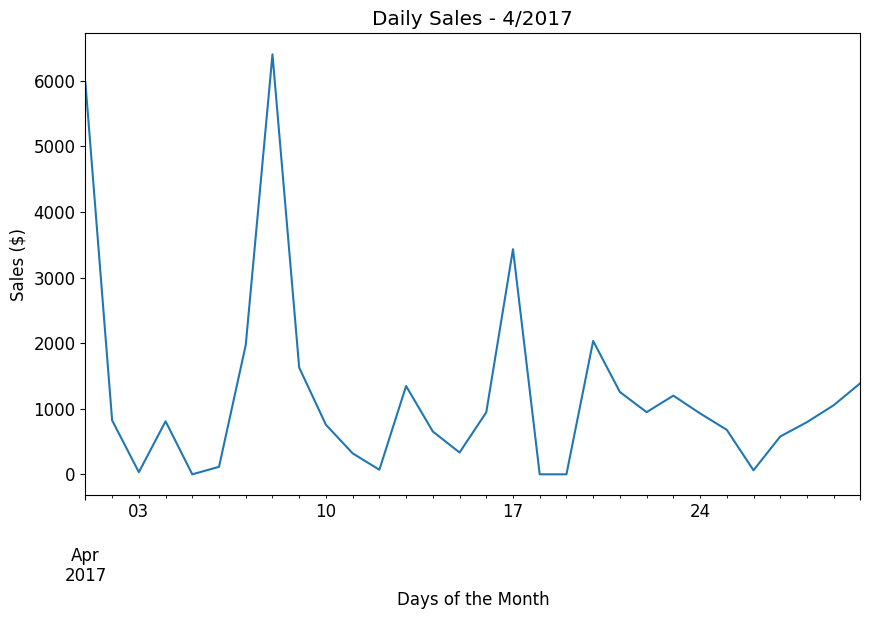

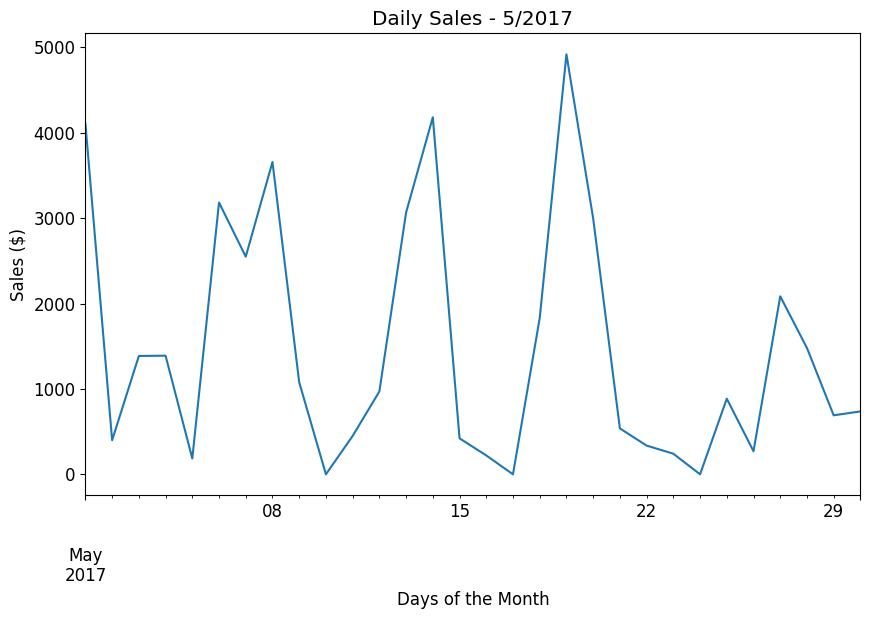

...

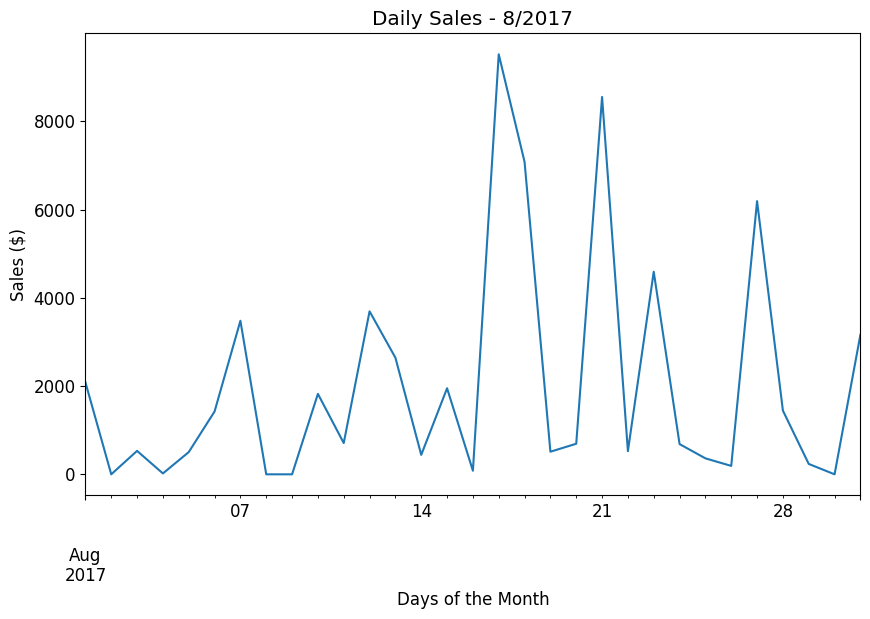

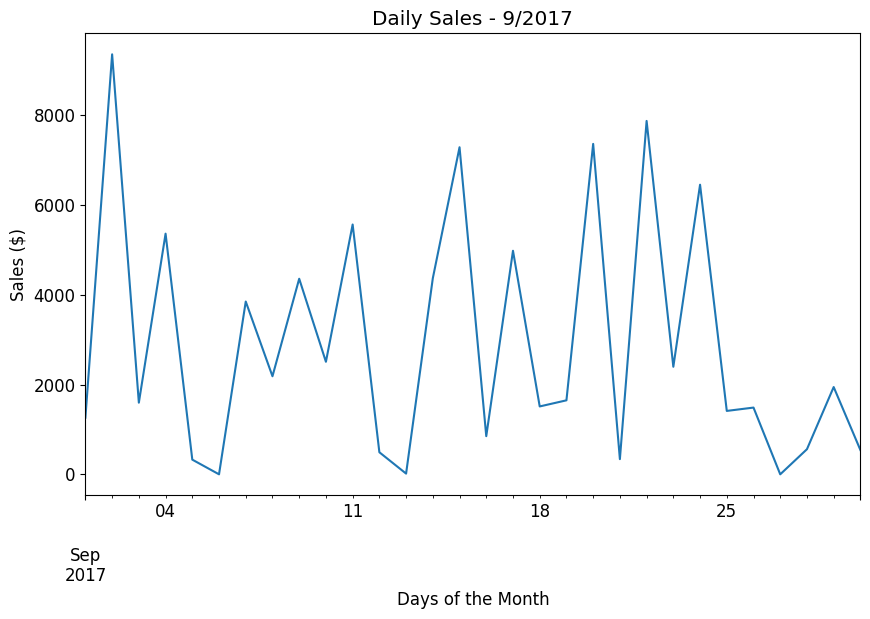

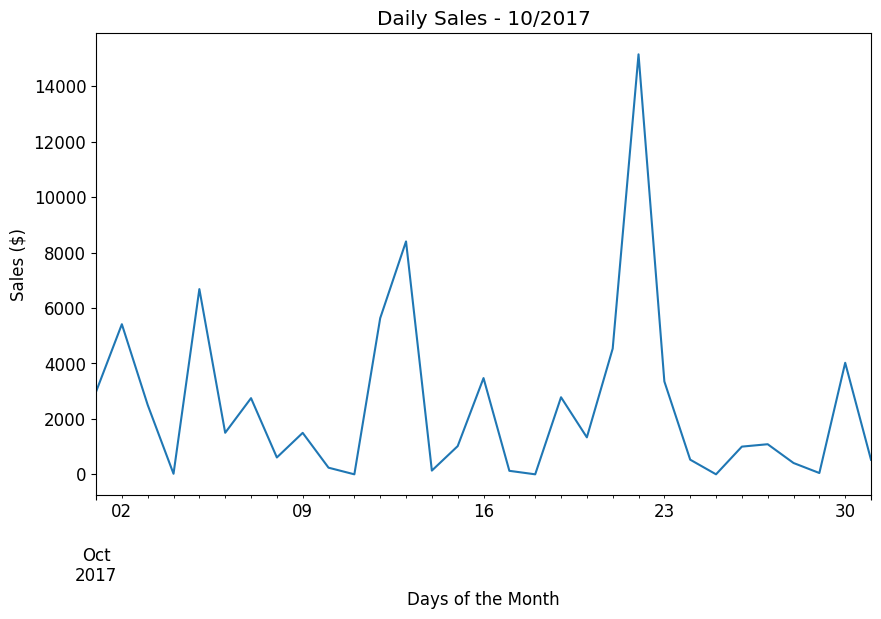

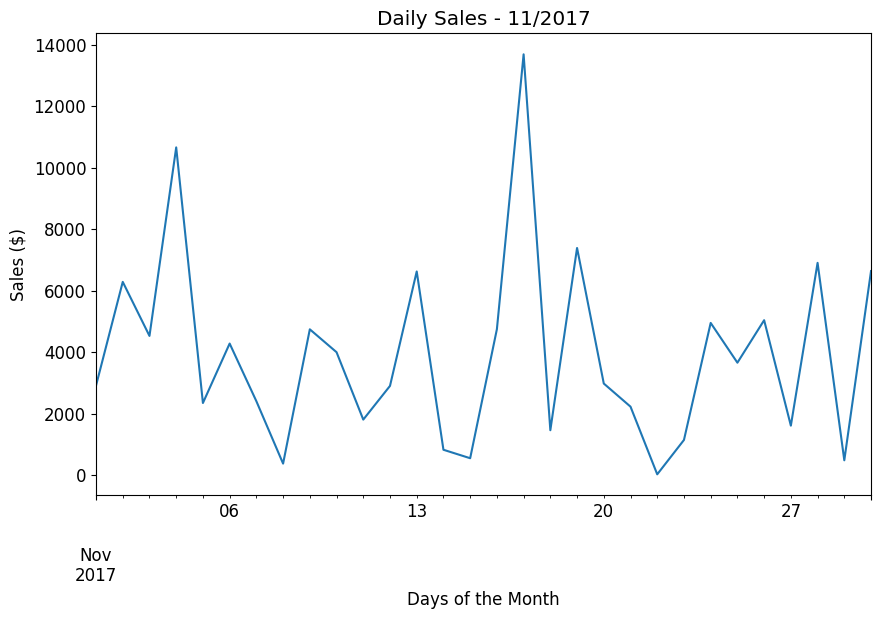

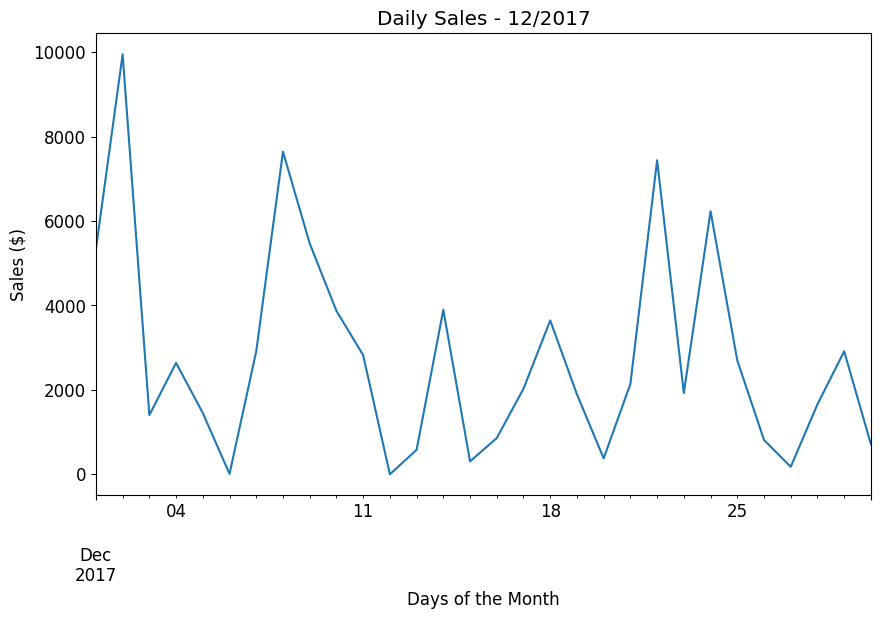

In [ ]:
# Filter data for 2017
sales_2017 = df.loc[df.index.year == 2017]

# Group by month
months_2017 = sales_2017.groupby(sales_2017.index.month)

# Plot daily sales for each month
for month, data in months_2017:
    daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
    daily_sales.plot(title=f'Daily Sales - {month}/2017', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xlabel('Days of the Month')
    plt.show()


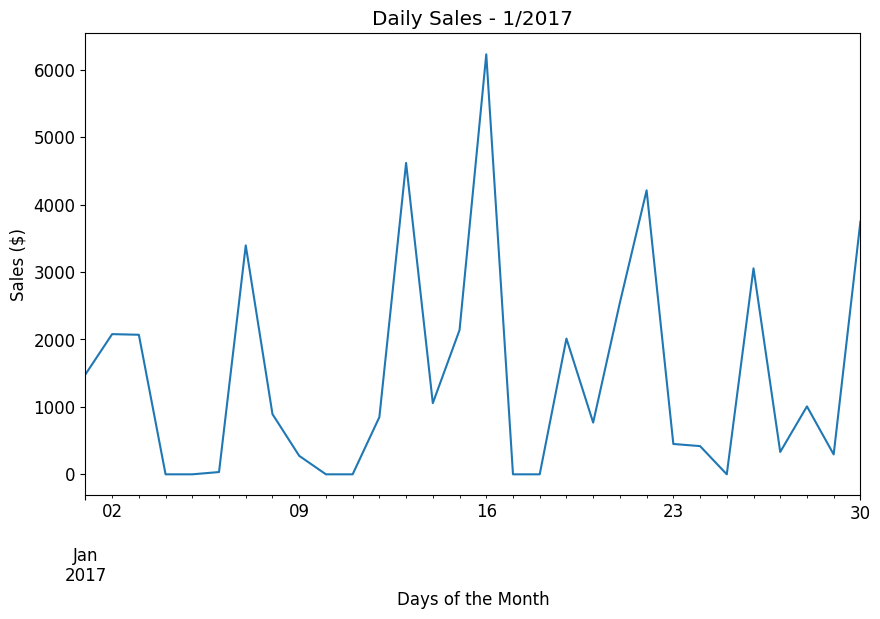

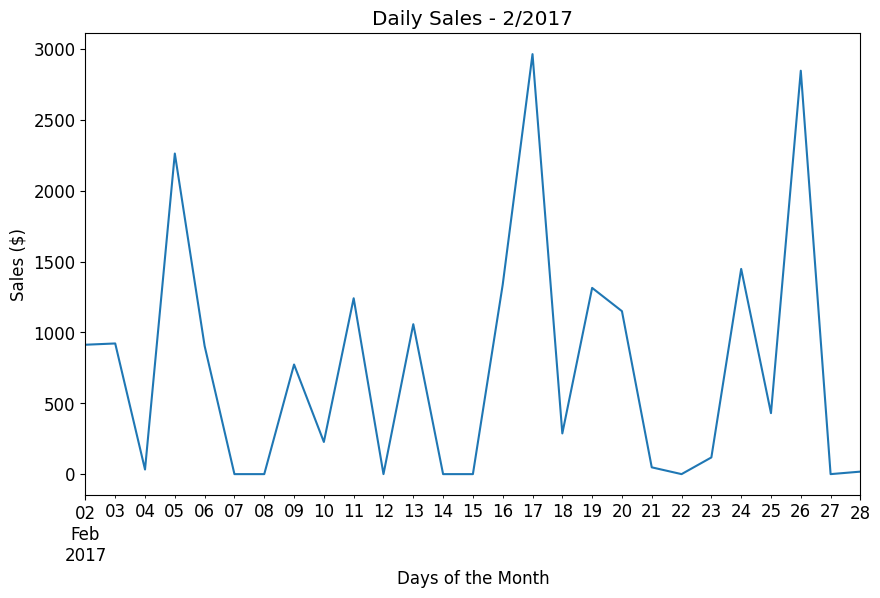

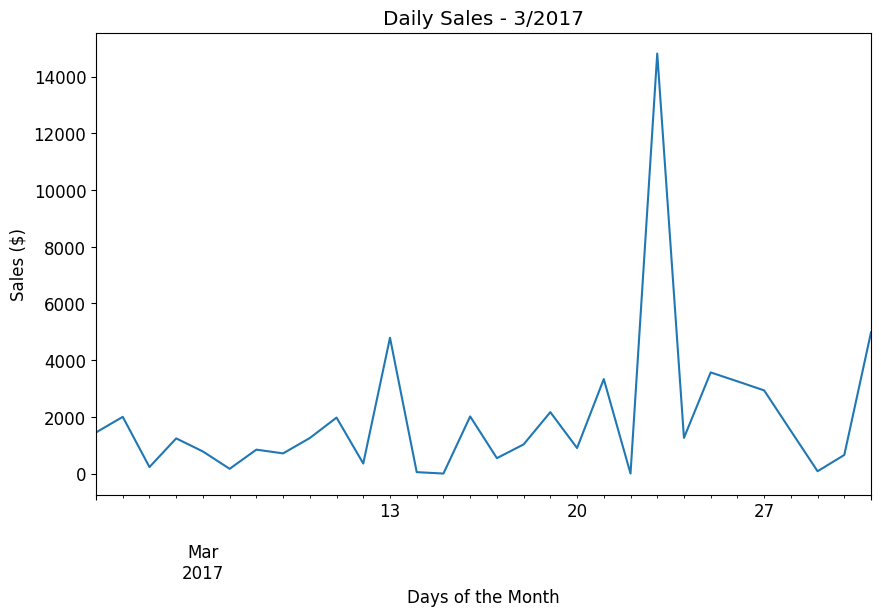

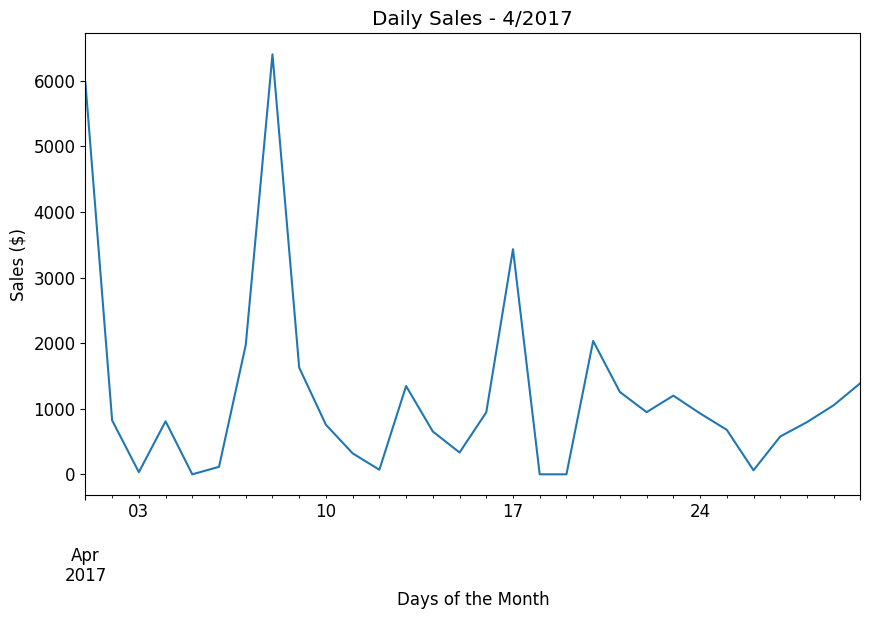

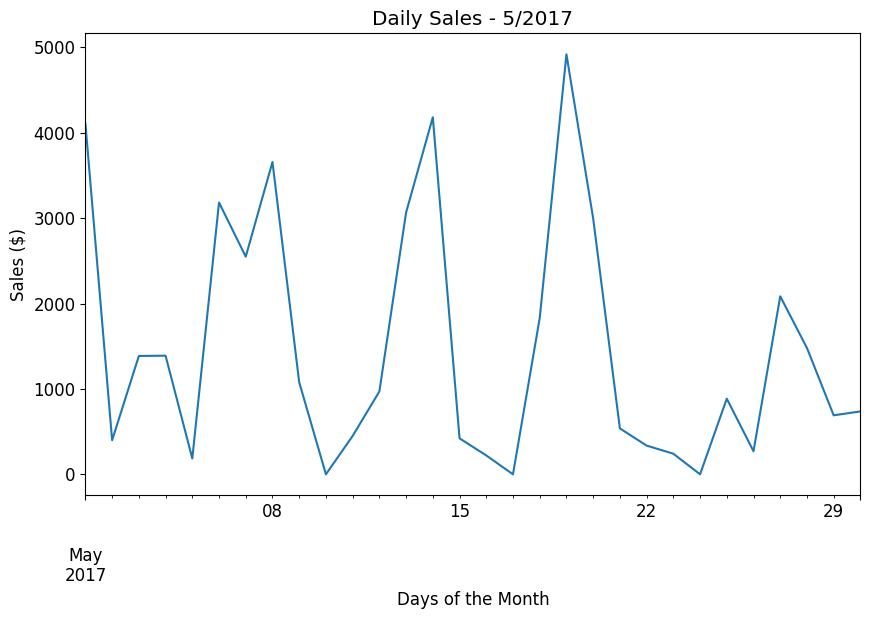

...

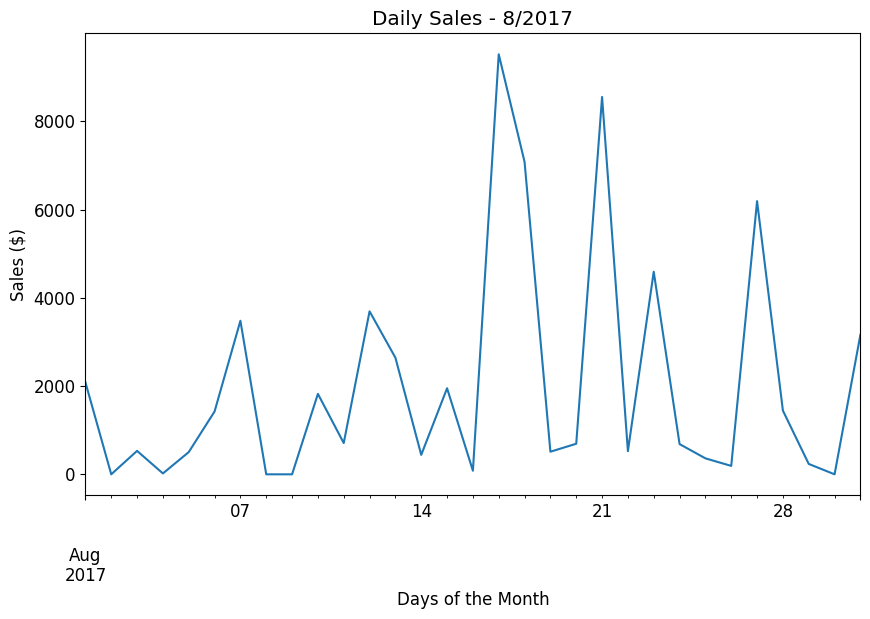

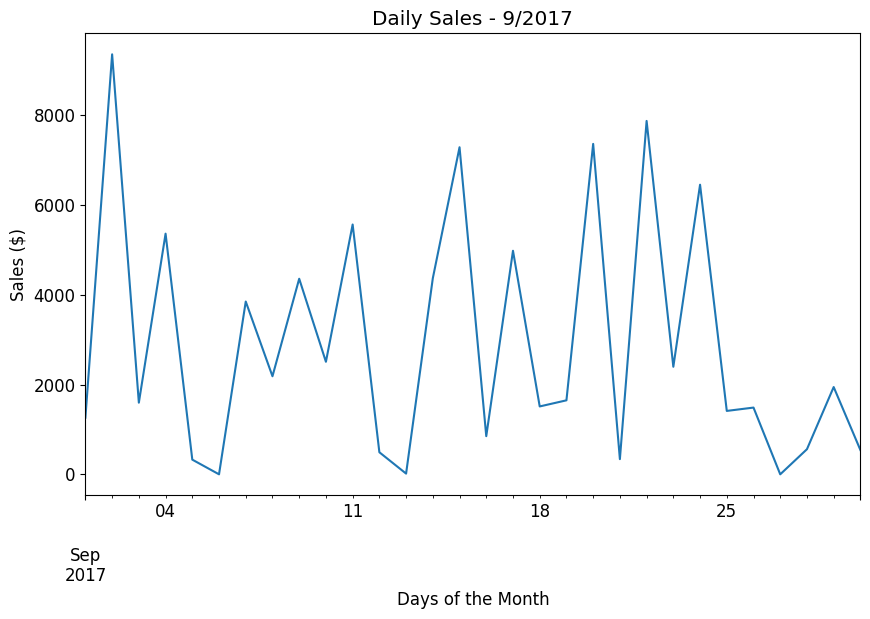

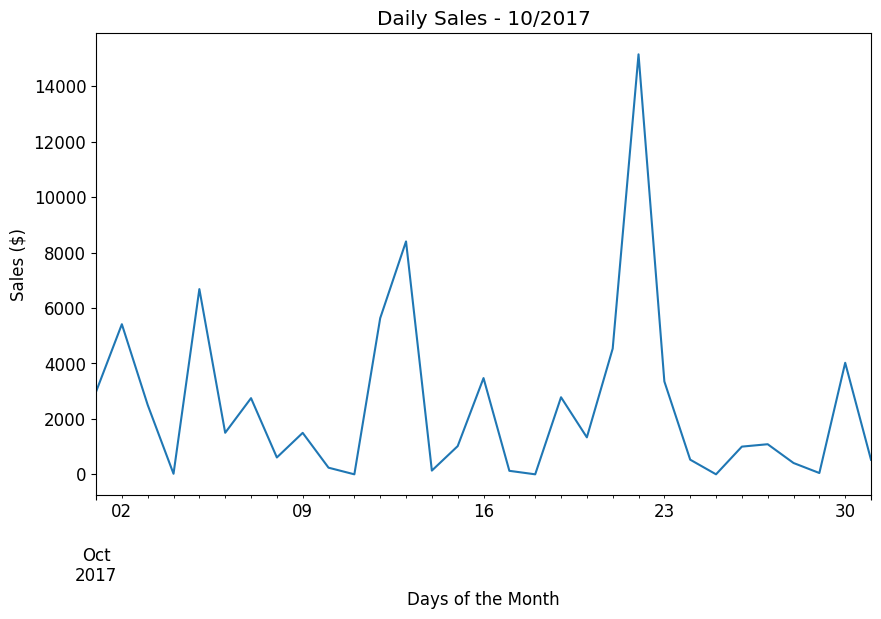

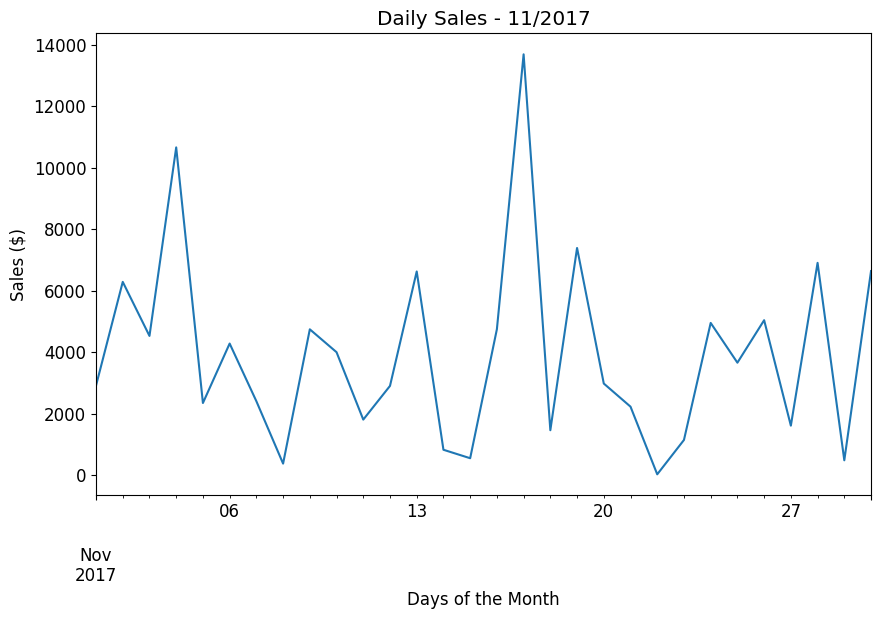

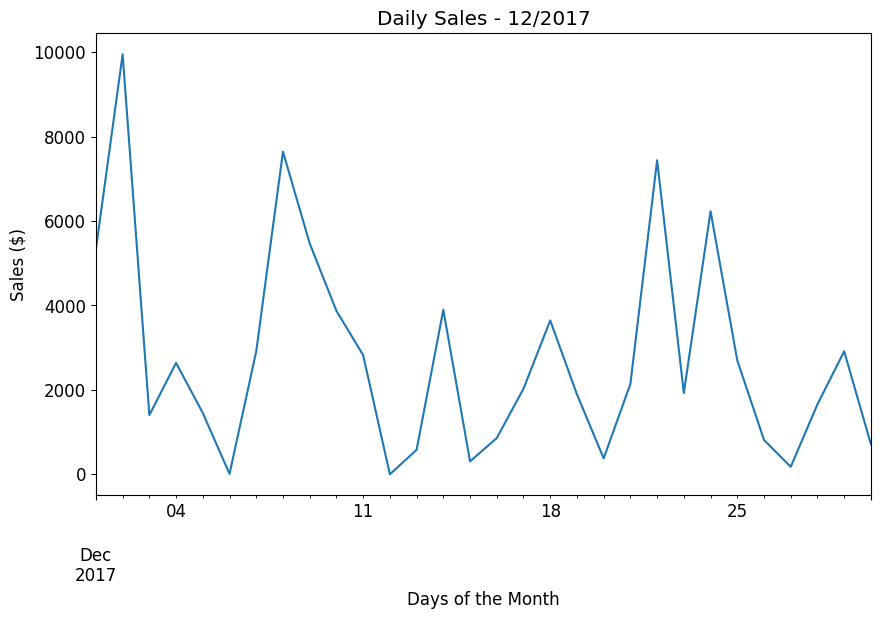

In [ ]:
# Filter data for 2017
sales_2017 = df.loc[df.index.year == 2017]

# Group by month
months_2017 = sales_2017.groupby(sales_2017.index.month)

# Plot daily sales for each month
for month, data in months_2017:
    daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
    daily_sales.plot(title=f'Daily Sales - {month}/2017', figsize=(10, 6))
    plt.ylabel('Sales ($)')
    plt.xlabel('Days of the Month')
    plt.show()


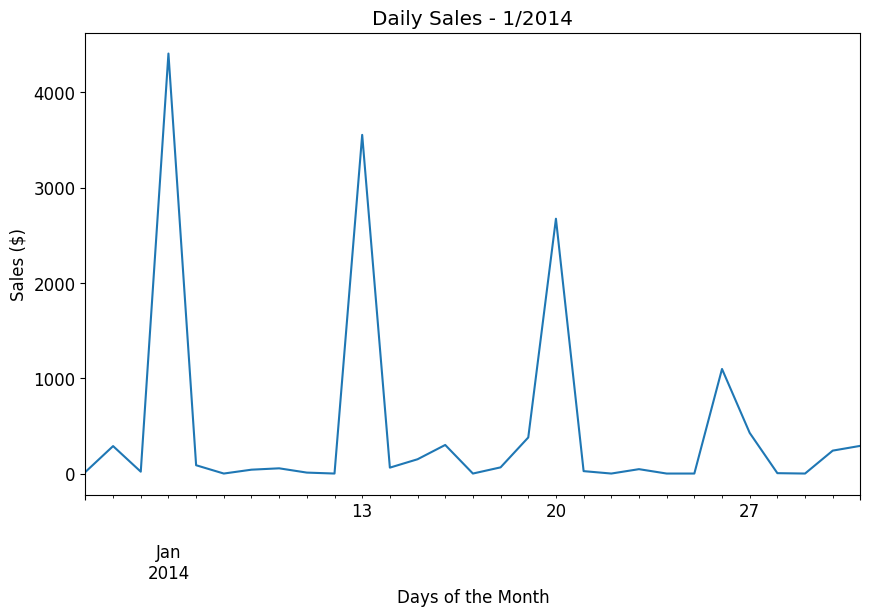

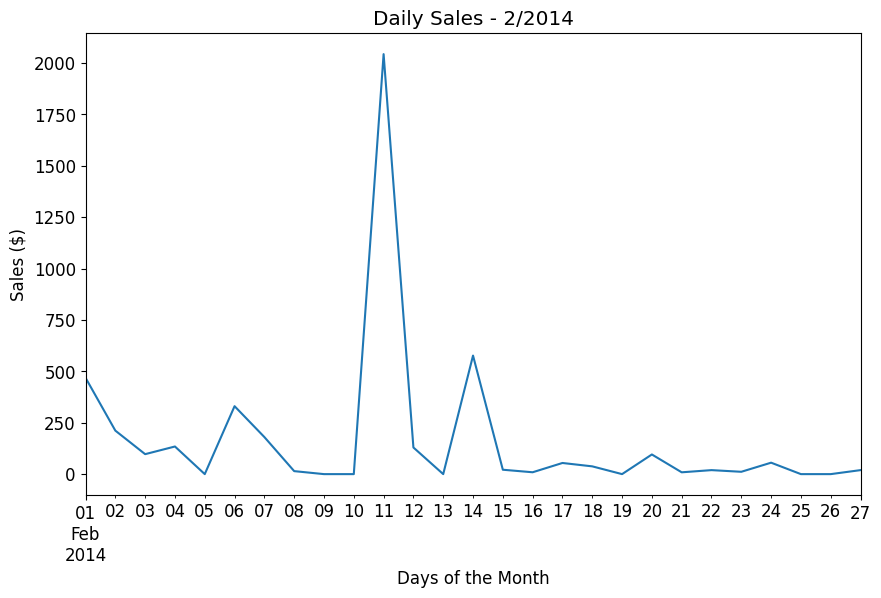

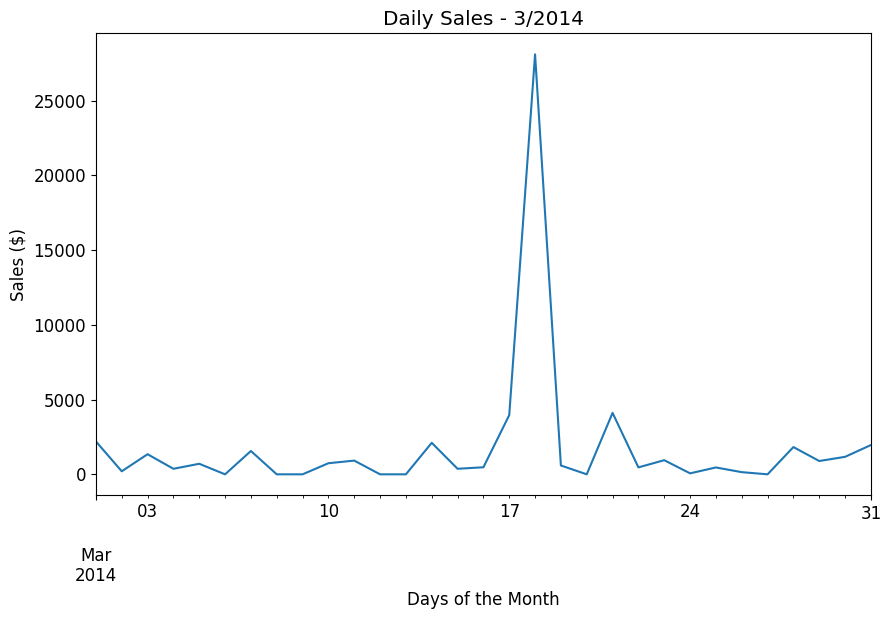

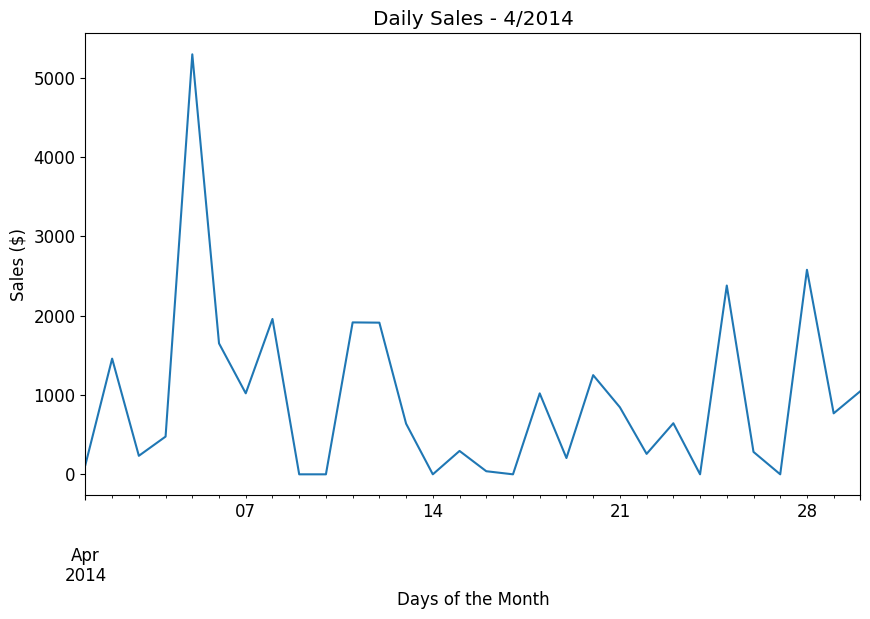

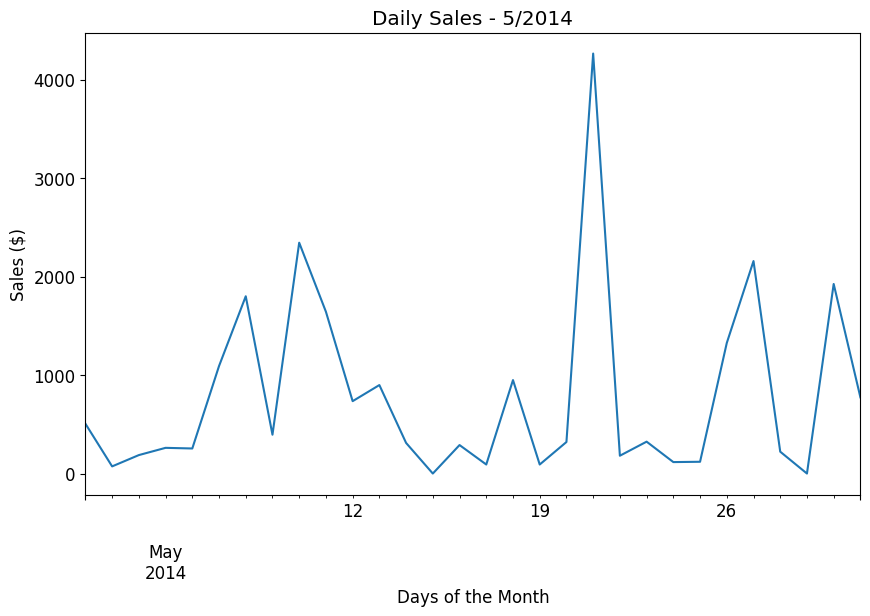

...

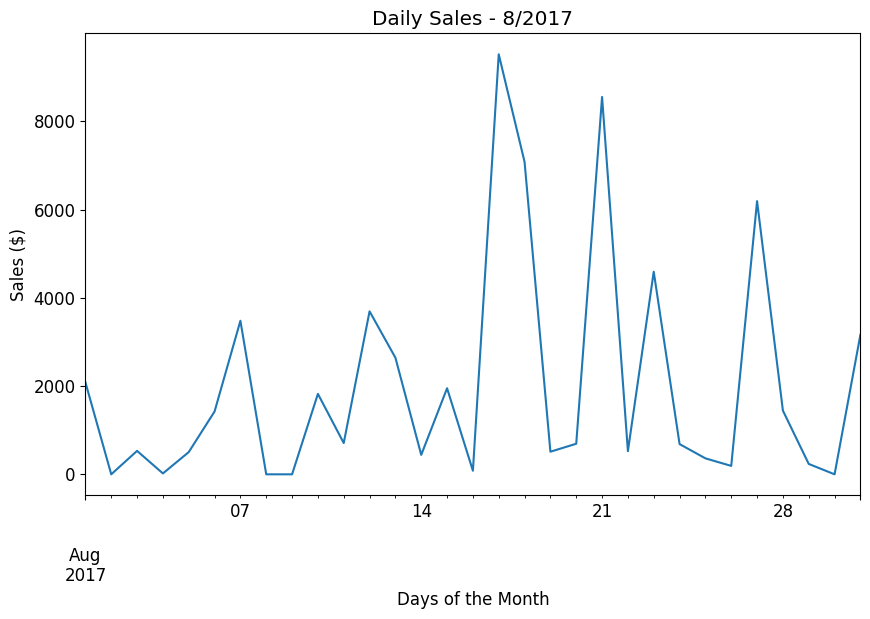

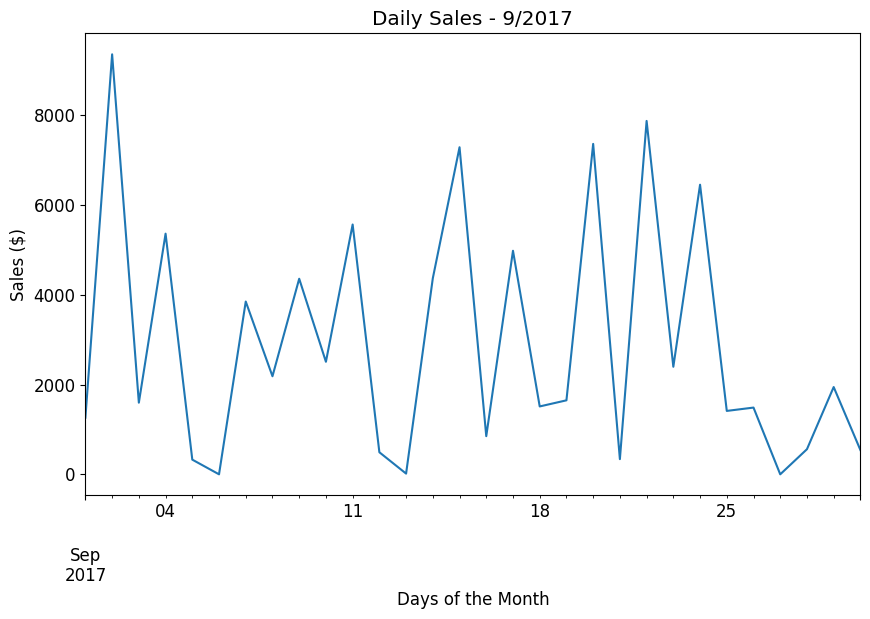

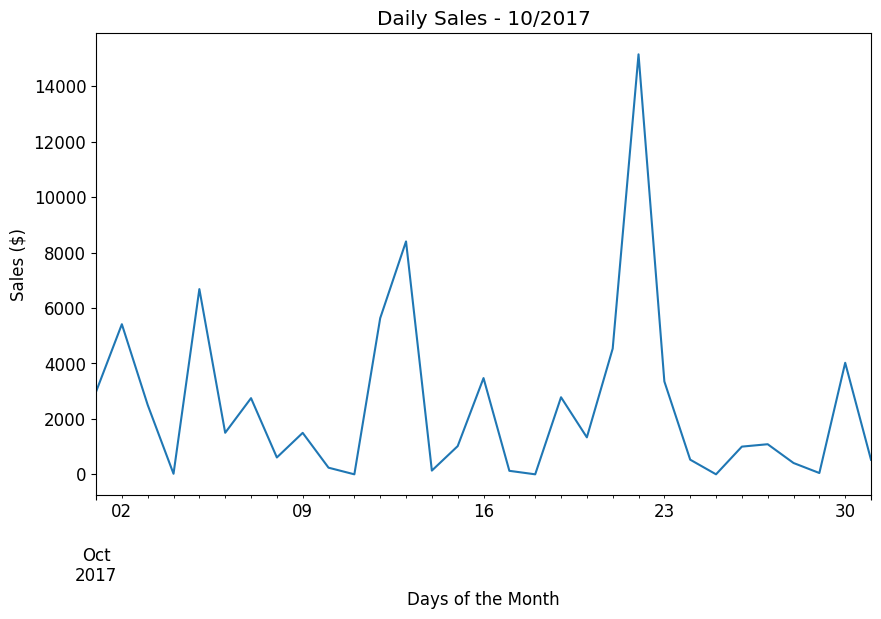

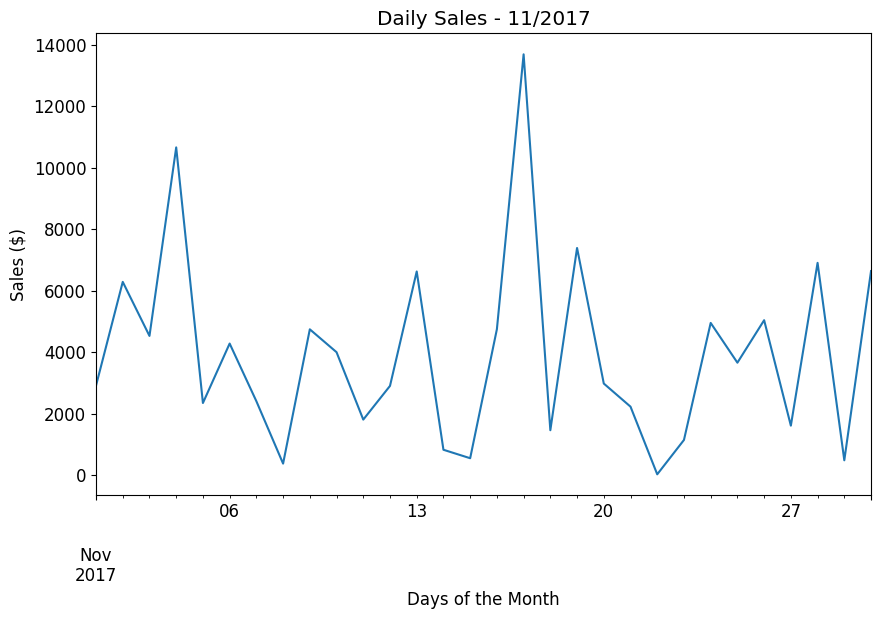

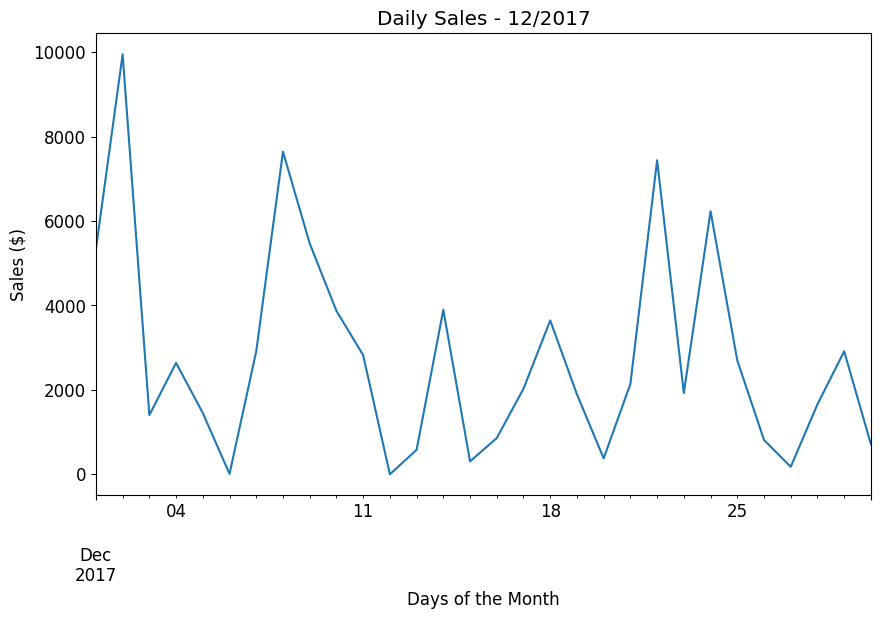

In [ ]:
# Loop through each year
for year in [2014, 2015, 2016, 2017]:
    # Filter data for the current year
    sales_year = df.loc[df.index.year == year]  # Correct filter condition

    # Group by month within the year
    months_year = sales_year.groupby(sales_year.index.month)

    # Plot daily sales for each month
    for month, data in months_year:
        daily_sales = data.resample('D')['Sales'].sum()  # Resample by day
        daily_sales.plot(title=f'Daily Sales - {month}/{year}', figsize=(10, 6))
        plt.ylabel('Sales ($)')
        plt.xlabel('Days of the Month')
        plt.show()  # Ensures the plot displays for each iteration


In [ ]:
# Extract year and group by product and year
df.reset_index(inplace=True)

In [ ]:
df.columns

Index(['Order Date', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit', 'Order_Year', 'Order_Month',
       'Order_Day', 'Order_Weekday'],
      dtype='object')

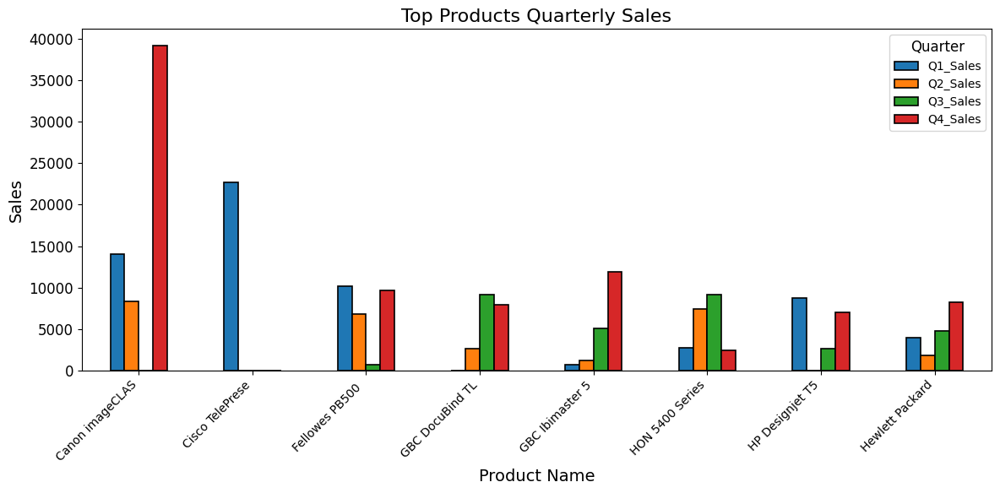

Top Products Quarterly Sales:
                                                     Q1_Sales  Q2_Sales  \
Product Name                                                              
Canon imageCLASS 2200 Advanced Copier               13999.960  8399.976   
Cisco TelePresence System EX90 Videoconferencin...  22638.480     0.000   
Fellowes PB500 Electric Punch Plastic Comb Bind...  10167.920  6863.346   
GBC DocuBind TL300 Electric Binding System              0.000  2690.970   
GBC Ibimaster 500 Manual ProClick Binding System      760.980  1217.568   
HON 5400 Series Task Chairs for Big and Tall         2803.920  7430.388   
HP Designjet T520 Inkjet Large Format Printer -...   8749.950     0.000   
Hewlett Packard LaserJet 3310 Copier                 3959.934  1799.970   

                                                    Q3_Sales   Q4_Sales  
Product Name                                                             
Canon imageCLASS 2200 Advanced Copier                  0.000  39199.888

In [ ]:
import matplotlib.pyplot as plt

# Create the Order_Quarter column based on Order_Month
df['Order_Quarter'] = df['Order_Month'].apply(lambda x: (x - 1) // 3 + 1)

# Calculate total sales for each product to identify the top 8 products
total_sales = df.groupby('Product Name')['Sales'].sum()

# Get the top 8 products by total sales
top_products = total_sales.nlargest(8).index

# Filter data for top products only
filtered_data = df[df['Product Name'].isin(top_products)]

# Group by product and quarter to calculate total sales for each quarter
quarterly_sales = (
    filtered_data.groupby(['Product Name', 'Order_Quarter'])['Sales']
    .sum()
    .unstack(fill_value=0)
)

# Rename columns to have Q1_Sales, Q2_Sales, etc.
quarterly_sales.columns = [f"Q{int(col)}_Sales" for col in quarterly_sales.columns]

# Plot a bar graph for quarterly sales
quarterly_sales.plot(kind='bar', figsize=(12, 6), edgecolor='black', linewidth=1.2)

# Customize the graph
plt.title('Top Products Quarterly Sales', fontsize=16)
plt.xlabel('Product Name', fontsize=14)
plt.ylabel('Sales', fontsize=14)

# Truncate the product names to first 15 characters
product_names = [name[:15] for name in quarterly_sales.index]

# Set the X-ticks with the truncated product names
plt.xticks(ticks=range(len(product_names)), labels=product_names, rotation=45, fontsize=10, ha='right')

plt.legend(title='Quarter', fontsize=10)
plt.tight_layout()

# Show the plot
plt.show()

# Display the final output
print("Top Products Quarterly Sales:")
print(quarterly_sales)


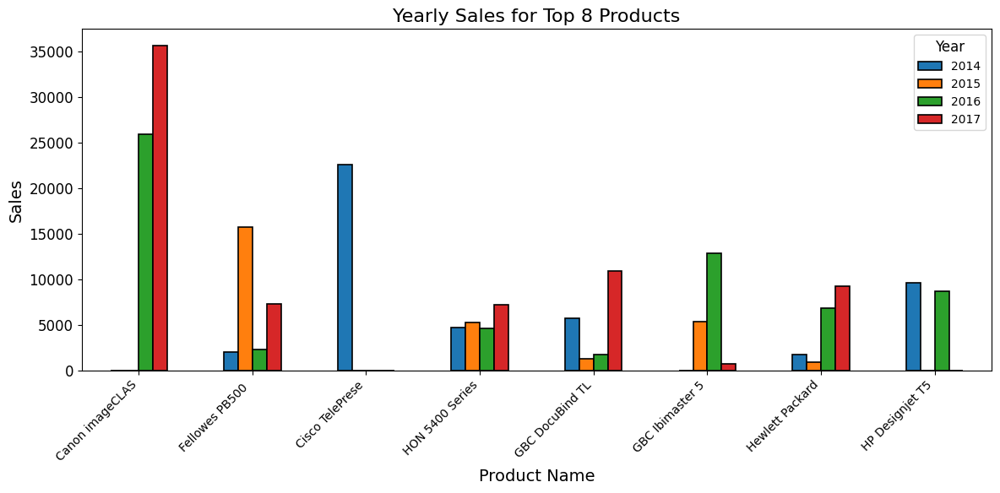

Yearly Sales for Top 8 Products:
Order Date                                               2014       2015  \
Product Name                                                               
Canon imageCLASS 2200 Advanced Copier                     NaN        NaN   
Fellowes PB500 Electric Punch Plastic Comb Bind...   2033.584  15760.276   
Cisco TelePresence System EX90 Videoconferencin...  22638.480        NaN   
HON 5400 Series Task Chairs for Big and Tall         4766.664   5257.350   
GBC DocuBind TL300 Electric Binding System           5740.736   1345.485   
GBC Ibimaster 500 Manual ProClick Binding System          NaN   5402.958   
Hewlett Packard LaserJet 3310 Copier                 1799.970    959.984   
HP Designjet T520 Inkjet Large Format Printer -...   9624.945        NaN   

Order Date                                               2016       2017  
Product Name                                                              
Canon imageCLASS 2200 Advanced Copier               2589

In [ ]:
import matplotlib.pyplot as plt

# Group by product and year to calculate yearly sales
yearly_performance = df.groupby(['Product Name', df['Order Date'].dt.year])['Sales'].sum().reset_index()

# Pivot to get yearly sales for each product
yearly_sales = yearly_performance.pivot(index='Product Name', columns='Order Date', values='Sales')

# Identify the top 8 products based on total sales across all years
top_products = yearly_sales.sum(axis=1).nlargest(8).index

# Filter the yearly sales data for top products only
yearly_sales_top = yearly_sales.loc[top_products]

# Plot a bar graph for yearly sales of top 8 products
yearly_sales_top.plot(kind='bar', figsize=(12, 6), edgecolor='black', linewidth=1.2)

# Customize the graph
plt.title('Yearly Sales for Top 8 Products', fontsize=16)
plt.xlabel('Product Name', fontsize=14)
plt.ylabel('Sales', fontsize=14)

# Truncate the product names to first 15 characters
product_names = [name[:15] for name in yearly_sales_top.index]

# Set the X-ticks with the truncated product names
plt.xticks(ticks=range(len(product_names)), labels=product_names, rotation=45, fontsize=10, ha='right')

plt.legend(title='Year', fontsize=10)
plt.tight_layout()

# Show the plot
plt.show()

# Display the final output
print("Yearly Sales for Top 8 Products:")
print(yearly_sales_top)


In [ ]:
# The Most Valuable Customers
# These customers buy more or higher-value products than the average customer.

# Exclude datetime columns from the summation
Top_customers = df.groupby(["Customer Name"])[['Sales']].sum().sort_values("Sales", ascending=False).head(20) # Sort the Customers as per the sales

Top_customers = Top_customers[["Sales"]].round(2) # Round off the Sales Value up to 2 decimal places
Top_customers.reset_index(inplace=True) # Since we have used groupby, we will have to reset the index to add the customer name into dataframe

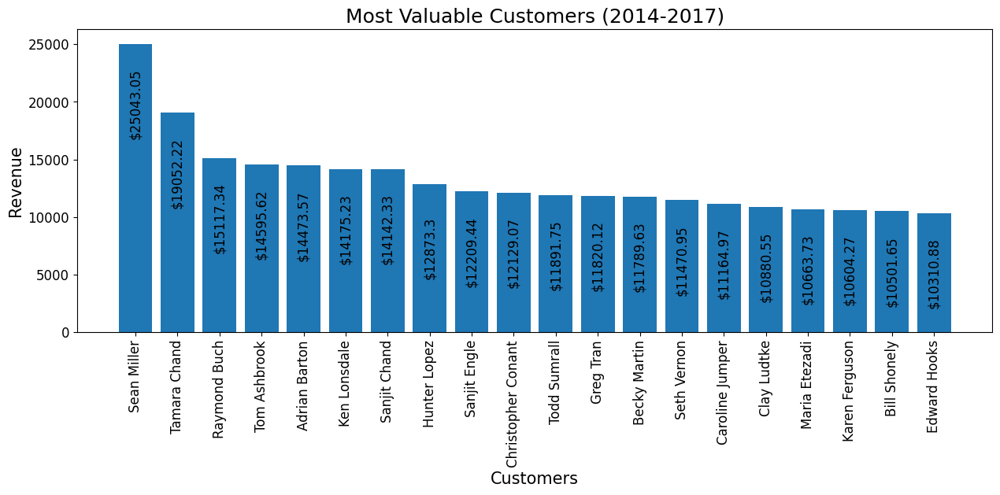

In [ ]:
plt.figure(figsize = (15,5)) # width and height of figure is defined in inches
plt.title("Most Valuable Customers (2014-2017)", fontsize=18)
plt.bar(Top_customers["Customer Name"], Top_customers["Sales"], linewidth = 1)
plt.xlabel("Customers",fontsize=15) # x axis shows the customers
plt.ylabel("Revenue",fontsize=15) # y axis shows the Revenue
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
for k,v in Top_customers["Sales"].items(): #To show the exact revenue generated on the figure
    plt.text(k,v-8000,'$'+ str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');

In [ ]:
# Top States which generated the highest revenue
Top_states = df.groupby(["State"])[['Sales']].sum().sort_values("Sales", ascending=False).head(20) # Sort the States as per the sales
Top_states = Top_states[["Sales"]].round(2) # Round off the Sales Value up to 2 decimal places
Top_states.reset_index(inplace=True) # Since we have used groupby, we will have to reset the index to add the states into dataframe


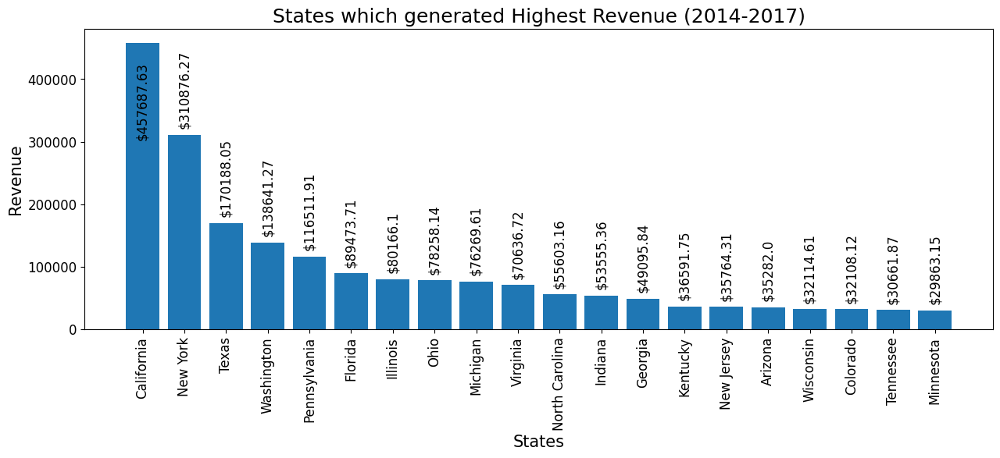

In [ ]:
plt.figure(figsize = (15,5)) # width and height of figure is defined in inches
plt.title("States which generated Highest Revenue (2014-2017)", fontsize=18)
plt.bar(Top_states["State"], Top_states["Sales"], linewidth = 1)
plt.xlabel("States",fontsize=15) # x axis shows the States
plt.ylabel("Revenue",fontsize=15) # y axis shows the Revenue
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
for k,v in Top_states["Sales"].items(): #To show the exact revenue generated on the figure
    if v>400000:
        plt.text(k,v-150000,'$'+ str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');
    else:
        plt.text(k,v+15000,'$'+ str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');

In [ ]:
# top cities which generated the highest revenue
Top_cities = df.groupby(["City"])[['Sales']].sum().sort_values("Sales", ascending=False).head(20) # Sort the States as per the sales
Top_cities = Top_cities[["Sales"]].round(2) # Round off the Sales Value up to 2 decimal places
Top_cities.reset_index(inplace=True) # Since we have used groupby, we will have to reset the index to add the cities into the dataframe

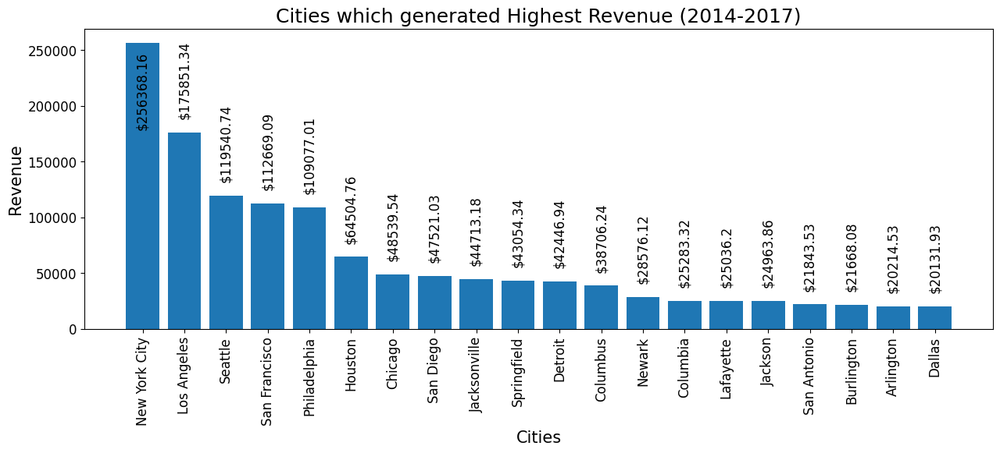

In [ ]:
plt.figure(figsize = (15,5)) # width and height of figure is defined in inches
plt.title("Cities which generated Highest Revenue (2014-2017)", fontsize=18)
plt.bar(Top_cities["City"], Top_cities["Sales"], linewidth = 1)
plt.xlabel("Cities",fontsize=15)  # x axis shows the States
plt.ylabel("Revenue",fontsize=15)  # y axis shows the Revenue
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
for k,v in Top_cities["Sales"].items(): #To show the exact revenue generated on the figure
    if v>250000:
        plt.text(k,v-75000,'$'+ str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');
    else:
        plt.text(k,v+15000,'$'+ str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');

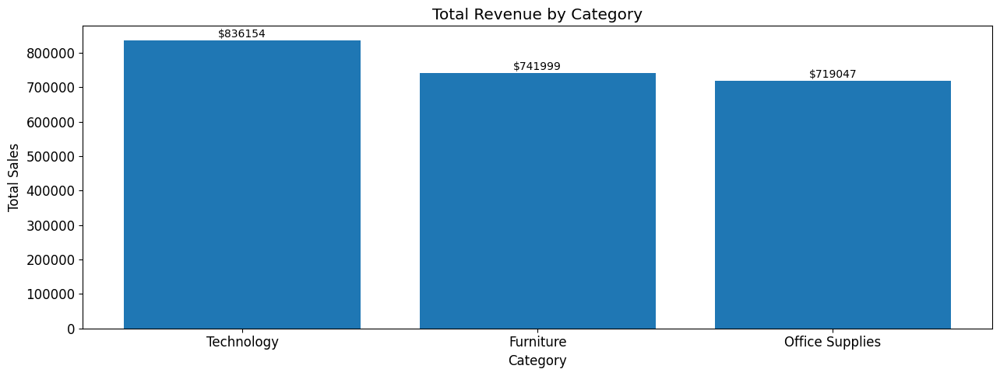

In [ ]:
# Revenue generated by each category
Top_category = df.groupby(["Category"])[['Sales']].sum().sort_values("Sales", ascending=False)  # Sort the Categories as per the sales
Top_category = Top_category[["Sales"]]  # Keep only the sales column in the dataframe
total_revenue_category = Top_category["Sales"].sum()  # Total revenue generated by categories
total_revenue_category = str(int(total_revenue_category))  # Convert to int and then to string
total_revenue_category = '$' + total_revenue_category  # Add '$' sign before the value
Top_category.reset_index(inplace=True)  # Reset index after using groupby

# Set figure size and font
plt.rcParams["figure.figsize"] = (13, 5)  # Width and height of figure
plt.rcParams['font.size'] = 12.0  # Font size
plt.rcParams['font.weight'] = 6  # Font weight

# Bar chart for Total Revenue by Category
fig, ax = plt.subplots()

# Create bar chart
bars = ax.bar(Top_category['Category'], Top_category['Sales'])

# Labeling the bars with revenue values
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 1000, f'${int(yval)}', ha='center', va='bottom', fontsize=10 )

# Adding title and labels
ax.set_xlabel('Category')
ax.set_ylabel('Total Sales')
ax.set_title('Total Revenue by Category')

# Show the plot
plt.tight_layout()
plt.show()


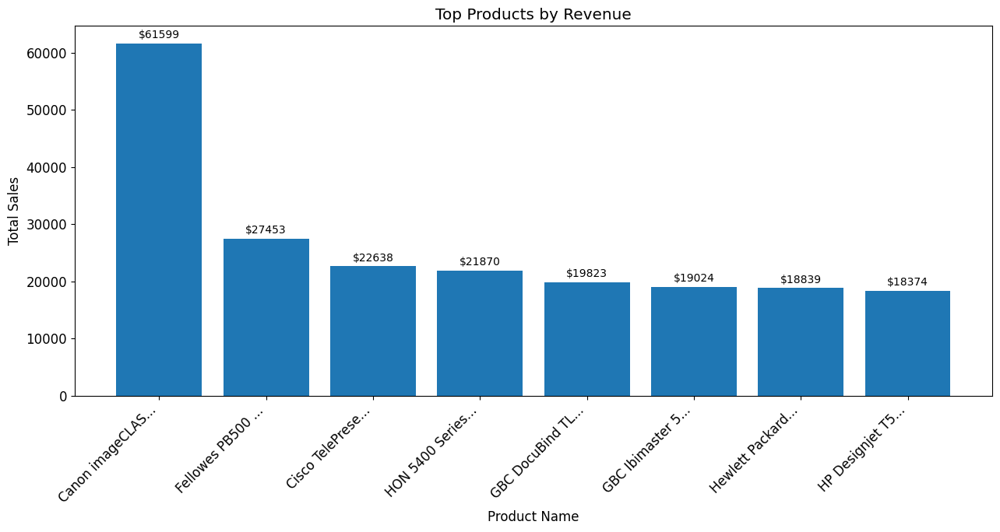

In [ ]:
# Which products contributed most to the revenue
Top_products = df.groupby(["Product Name"])[['Sales']].sum().sort_values("Sales", ascending=False).head(8)  # Sort the top products by sales
Top_products = Top_products[["Sales"]].round(2)  # Round off the Sales Value to 2 decimal places
Top_products.reset_index(inplace=True)  # Reset index after using groupby
total_revenue_products = Top_products["Sales"].sum()  # Total revenue generated by the top products
total_revenue_products = str(int(total_revenue_products))  # Convert to int and then to string
total_revenue_products = '$' + total_revenue_products  # Add '$' sign before the value

# Truncate product names to a maximum length of 15 characters
Top_products['Product Name'] = Top_products['Product Name'].apply(lambda x: x[:15] + '...' if len(x) > 15 else x)

# Set figure size and font properties
plt.rcParams["figure.figsize"] = (13, 7)  # Width and height of figure
plt.rcParams['font.size'] = 12.0  # Font size

# Bar chart for Top Products
fig, ax = plt.subplots()

# Create bar chart
bars = ax.bar(Top_products['Product Name'], Top_products['Sales'])

# Labeling the bars with revenue values
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 500, f'${int(yval)}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
ax.set_xlabel('Product Name')
ax.set_ylabel('Total Sales')
ax.set_title('Top Products by Revenue')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


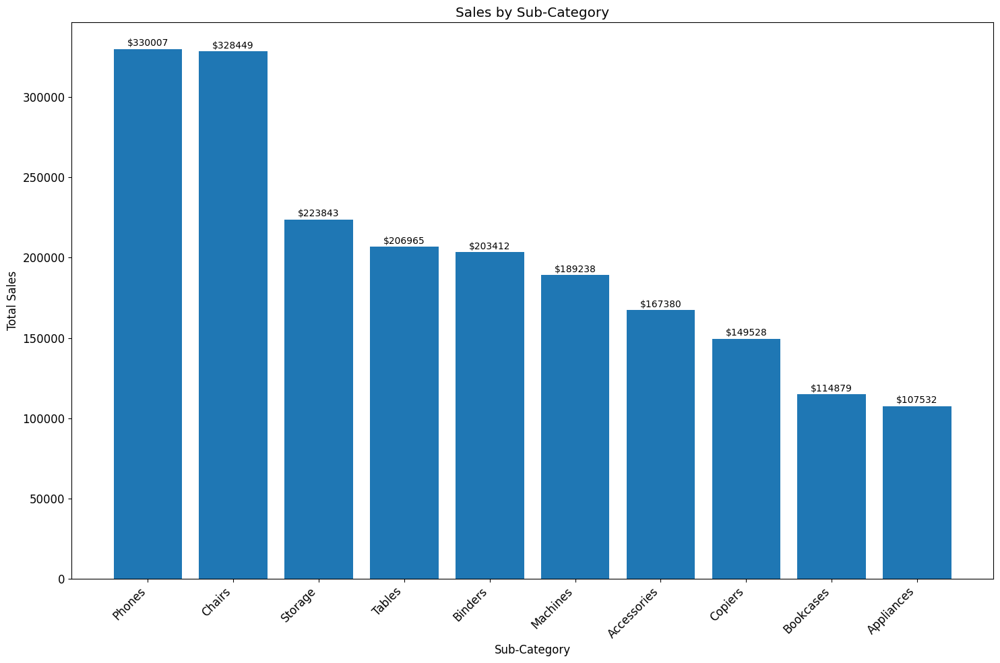

In [ ]:
# Revenue generated by each Sub-Category
Top_subcat = df.groupby(['Category','Sub-Category'])[['Sales']].sum().sort_values("Sales", ascending=False).head(10)
Top_subcat = Top_subcat[["Sales"]].astype(int)  # Cast Sales column to integer data type
Top_subcat.reset_index(inplace=True)  # Reset the index to add both columns into the dataframe

# Set figure size and font properties
plt.rcParams["figure.figsize"] = (15, 10)  # Width and height of figure
fig, ax = plt.subplots()

# Bar chart for Sales by Sub-Category only
subcat_bars = ax.bar(Top_subcat['Sub-Category'], Top_subcat['Sales'], label='Sub-Category Sales')

# Add labels for sub-category bars
for bar in subcat_bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 500, f'${int(yval)}', ha='center', va ='bottom', fontsize=10)

# Adding title and labels
ax.set_xlabel('Sub-Category')
ax.set_ylabel('Total Sales')
ax.set_title('Sales by Sub-Category')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


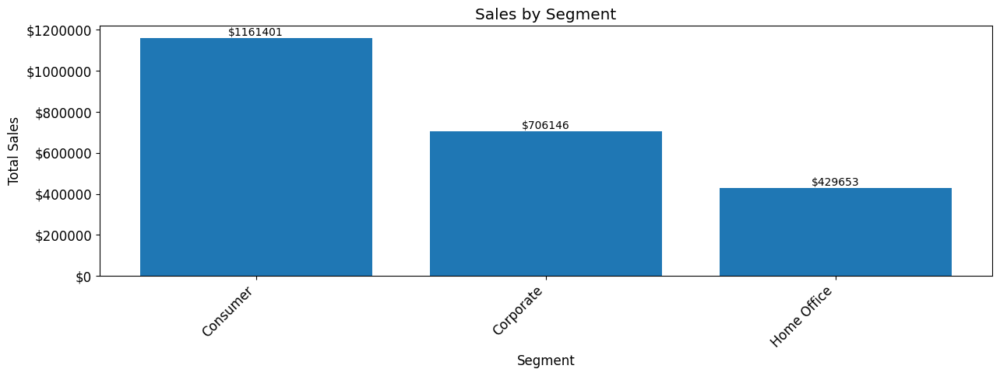

In [ ]:
# Which Segment has the highest sales
from matplotlib.ticker import FuncFormatter # Import FuncFormatter
Top_segment = df.groupby(["Segment"])[['Sales']].sum().sort_values("Sales", ascending=False)  # Sort the segments by sales
Top_segment = Top_segment[["Sales"]]  # Keep only the sales column
Top_segment.reset_index(inplace=True)  # Reset index to add the segment column

# Total revenue for the segments
total_revenue_segment = Top_segment["Sales"].sum()  # Calculate total revenue
total_revenue_segment = str(int(total_revenue_segment))  # Convert total revenue to integer
total_revenue_segment = '$' + total_revenue_segment  # Add dollar sign

# Set figure size and font properties
plt.rcParams["figure.figsize"] = (13, 5)  # Width and height of the figure
plt.rcParams['font.size'] = 12.0  # Font size
plt.rcParams['font.weight'] = 6  # Font weight

# Bar chart for Sales by Segment
fig, ax = plt.subplots()

# Create the bar chart
bars = ax.bar(Top_segment['Segment'], Top_segment['Sales'])

# Add labels for each bar
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 500, f'${int(yval)}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
ax.set_xlabel('Segment')
ax.set_ylabel('Total Sales')
ax.set_title('Sales by Segment')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Format y-axis to display in original unit (no scientific notation)
def format_yaxis(x, pos):
    return f'${int(x)}'

ax.yaxis.set_major_formatter(FuncFormatter(format_yaxis))

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
# Which region has highest sales
Top_region = df.groupby(["Region"])[['Sales']].sum().sort_values("Sales", ascending=False) # Sort the Region as per the sales
Top_region = Top_region[["Sales"]].astype(int) # Cast Sales column to integer data type
Top_region.reset_index(inplace=True) # Since we have used groupby, we will have to reset the index to add the Region column into the data frame

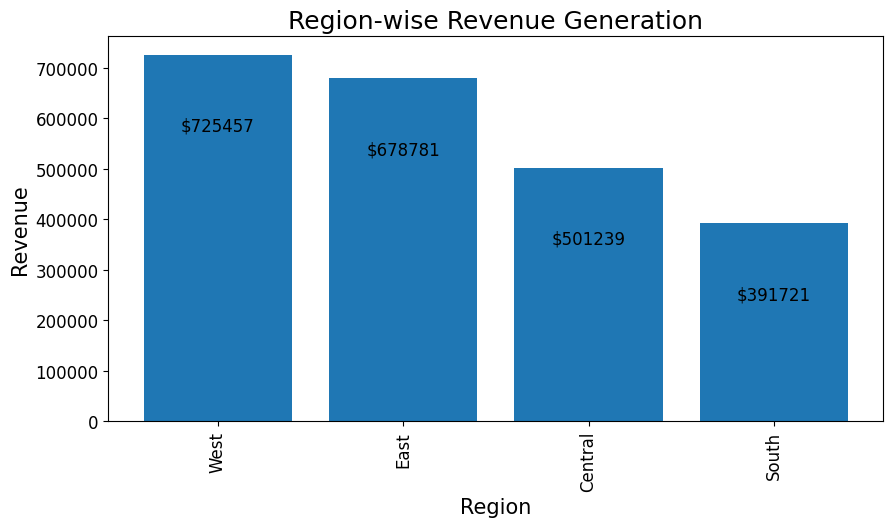

In [ ]:
plt.figure(figsize = (10,5)) # width and height of figure is defined in inches
plt.title("Region-wise Revenue Generation", fontsize=18)
plt.bar(Top_region["Region"], Top_region["Sales"], linewidth = 1)
plt.xlabel("Region",fontsize=15) # x axis shows the Region
plt.ylabel("Revenue",fontsize=15) # y axis show the Revenue generated
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
for k,v in Top_region["Sales"].items(): #To show the exact revenue generated on the figure
        plt.text(k,v-150000,'$'+ str(v), fontsize=12,color='k', horizontalalignment='center');

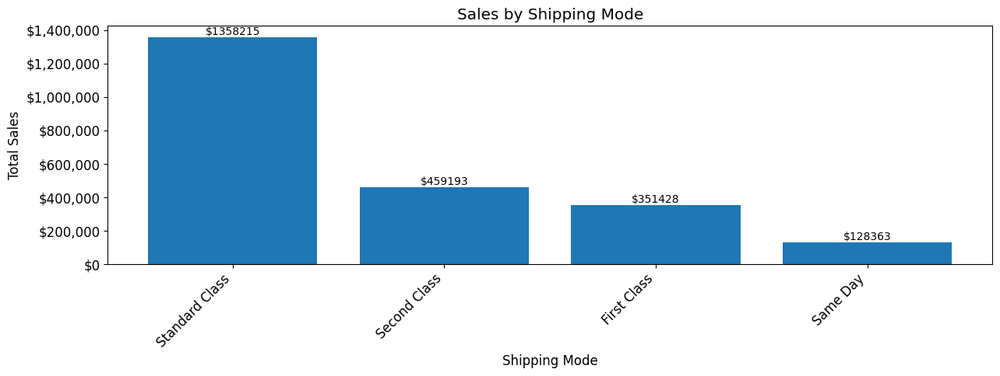

In [ ]:
# Which shipping mode has the highest sales
Top_shipping = df.groupby(["Ship Mode"])[['Sales']].sum().sort_values("Sales", ascending=False)  # Sort by sales
Top_shipping = Top_shipping[["Sales"]]  # Keep only the sales column
Top_shipping.reset_index(inplace=True)  # Reset index to add the Ship Mode column

# Total revenue for the shipping modes
total_revenue_ship = Top_shipping["Sales"].sum()  # Calculate total revenue
total_revenue_ship = str(int(total_revenue_ship))  # Convert total revenue to integer
total_revenue_ship = '$' + total_revenue_ship  # Add dollar sign

# Set figure size and font properties
plt.rcParams["figure.figsize"] = (13, 5)  # Width and height of the figure
plt.rcParams['font.size'] = 12.0  # Font size
plt.rcParams['font.weight'] = 6  # Font weight

# Bar chart for Sales by Shipping Mode
fig, ax = plt.subplots()

# Create the bar chart
bars = ax.bar(Top_shipping['Ship Mode'], Top_shipping['Sales'])

# Add labels for each bar
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 500, f'${int(yval)}', ha='center', va='bottom', fontsize=10)

# Adding title and labels
ax.set_xlabel('Shipping Mode')
ax.set_ylabel('Total Sales')
ax.set_title('Sales by Shipping Mode')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Format y-axis to display in original unit (no scientific notation)
def format_yaxis(x, pos):
    return f'${int(x):,}'  # Format with commas for thousands

ax.yaxis.set_major_formatter(FuncFormatter(format_yaxis))

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
# Applying model

In [ ]:
df.columns

Index(['Order Date', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit', 'Order_Year', 'Order_Month',
       'Order_Day', 'Order_Weekday', 'Order_Quarter'],
      dtype='object')

In [ ]:
data =df.copy()

In [ ]:
data.columns

Index(['Order Date', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit', 'Order_Year', 'Order_Month',
       'Order_Day', 'Order_Weekday', 'Order_Quarter'],
      dtype='object')

In [ ]:
# Data preparation
# Add lagged sales features for the past 1, 2, and 3 days
data['Sales_lag_1'] = data['Sales'].shift(1)  # Previous day
data['Sales_lag_2'] = data['Sales'].shift(2)  # Two days ago
data['Sales_lag_3'] = data['Sales'].shift(3)  # Three days ago


In [ ]:
data.isnull().sum()

,0
Order Date,0
Order ID,0
Ship Date,0
Ship Mode,0
Customer ID,0
Customer Name,0
Segment,0
Country,0
City,0
State,0


In [ ]:
data.dropna(inplace=True)

In [ ]:
data.dtypes

,0
Order Date,datetime64[ns]
Order ID,object
Ship Date,datetime64[ns]
Ship Mode,object
Customer ID,object
Customer Name,object
Segment,object
Country,object
City,object
State,object


In [ ]:
# Extract Features
data['Ship_Days'] = (data['Ship Date'].dt.day - data['Order Date'].dt.day)

In [ ]:
df.head()

,Order Date,Order ID,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,...,Product Name,Sales,Quantity,Discount,Profit,Order_Year,Order_Month,Order_Day,Order_Weekday,Order_Quarter
0,2014-01-03,CA-2014-103800,2014-01-07,Standard Class,DP-13000,Darren Powers,Consumer,United States,Houston,Texas,...,"Message Book, Wirebound, Four 5 1/2"" X 4"" Form...",16.448,2,0.2,5.5512,2014,1,3,4,1
1,2014-01-04,CA-2014-112326,2014-01-08,Standard Class,PO-19195,Phillina Ober,Home Office,United States,Naperville,Illinois,...,Avery 508,11.784,3,0.2,4.2717,2014,1,4,5,1
2,2014-01-04,CA-2014-112326,2014-01-08,Standard Class,PO-19195,Phillina Ober,Home Office,United States,Naperville,Illinois,...,SAFCO Boltless Steel Shelving,272.736,3,0.2,-64.7748,2014,1,4,5,1
3,2014-01-04,CA-2014-112326,2014-01-08,Standard Class,PO-19195,Phillina Ober,Home Office,United States,Naperville,Illinois,...,GBC Standard Plastic Binding Systems Combs,3.540,2,0.8,-5.4870,2014,1,4,5,1
4,2014-01-05,CA-2014-141817,2014-01-12,Standard Class,MB-18085,Mick Brown,Consumer,United States,Philadelphia,Pennsylvania,...,Avery Hi-Liter EverBold Pen Style Fluorescent ...,19.536,3,0.2,4.8840,2014,1,5,6,1


In [ ]:
data = data.drop(columns=['Order ID', 'Customer ID', 'Customer Name', 'Product Name', 'Product ID', 'Order Date', 'Ship Date', 'Postal Code'])


In [ ]:
# One-hot encode categorical columns
categorical_columns = ['Ship Mode', 'Segment', 'Country', 'City', 'State', 'Region', 'Category', 'Sub-Category']
data_encoded = pd.get_dummies(data, columns=categorical_columns, drop_first=True)


In [ ]:
print(data.dtypes)

Ship Mode         object
Segment           object
Country           object
City              object
State             object
Region            object
Category          object
Sub-Category      object
Sales            float64
Quantity           int64
Discount         float64
Profit           float64
Order_Year         int32
Order_Month        int32
Order_Day          int32
Order_Weekday      int32
Order_Quarter      int64
Sales_lag_1      float64
Sales_lag_2      float64
Sales_lag_3      float64
Ship_Days          int32
dtype: object


In [ ]:
print(data_encoded.dtypes)


Sales                    float64
Quantity                   int64
Discount                 float64
Profit                   float64
Order_Year                 int32
                          ...   
Sub-Category_Paper          bool
Sub-Category_Phones         bool
Sub-Category_Storage        bool
Sub-Category_Supplies       bool
Sub-Category_Tables         bool
Length: 617, dtype: object


In [ ]:
# Convert all boolean columns to integers
data_encoded = data_encoded.astype({col: 'int' for col in data_encoded.select_dtypes(include='bool').columns})
print(data_encoded.dtypes)


Sales                    float64
Quantity                   int64
Discount                 float64
Profit                   float64
Order_Year                 int32
                          ...   
Sub-Category_Paper         int64
Sub-Category_Phones        int64
Sub-Category_Storage       int64
Sub-Category_Supplies      int64
Sub-Category_Tables        int64
Length: 617, dtype: object


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Split the data into training (2014-2016) and testing (2017)
train_data = data_encoded[data_encoded['Order_Year'].isin([2014, 2015, 2016])]
test_data = data_encoded[data_encoded['Order_Year'] == 2017]

# Prepare the features (X) and target variable (y) for training and testing
X_train = train_data.drop(columns=['Sales'])
y_train = train_data['Sales']
X_test = test_data.drop(columns=['Sales'])
y_test = test_data['Sales']

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the entire training set
rf_model.fit(X_train, y_train)

# Evaluate the model on the training set
y_pred_train_rf = rf_model.predict(X_train)

# Calculate MSE and R² for the training set
mse_rf_train = mean_squared_error(y_train, y_pred_train_rf)
r2_rf_train = r2_score(y_train, y_pred_train_rf)

# Print the training performance
print(f"Random Forest (Training) MSE: {mse_rf_train}")
print(f"Random Forest (Training) R²: {r2_rf_train}")

# Predict on the test set
y_pred_rf_test = rf_model.predict(X_test)


# Calculate MSE and R² for the test set
mse_rf_test = mean_squared_error(y_test, y_pred_rf_test)
r2_rf_test = r2_score(y_test, y_pred_rf_test)

# Print the test performance
print(f"Random Forest (Test) MSE: {mse_rf_test}")
print(f"Random Forest (Test) R²: {r2_rf_test}")



Random Forest (Training) MSE: 21078.197377587258
Random Forest (Training) R²: 0.9487521389944273
Random Forest (Test) MSE: 57656.31476326658
Random Forest (Test) R²: 0.8316225200457276


In [ ]:
from sklearn.model_selection import cross_val_score
# Cross-validation to assess model generalization using R²
cv_scores_r2 = cross_val_score(rf_model, X_train, y_train, cv=10, scoring='r2')
print(f"Cross-validated R²: {cv_scores_r2.mean()}")

Cross-validated R²: 0.696721848539651


In [ ]:
# Add the predicted sales as a new column in the test_data dataframe
test_data['Predicted Sales'] = y_pred_rf_test

<ipython-input-620-08f6c36b706c>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data['Predicted Sales'] = y_pred_rf_test
<ipython-input-620-08f6c36b706c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['Predicted Sales'] = y_pred_rf_test


In [ ]:
# Calculate total actual sales for 2017
total_actual_sales_2017 = test_data['Sales'].sum()

# Calculate total predicted sales for 2017
total_predicted_sales_2017 = test_data['Predicted Sales'].sum()

# Print the results
print(f"Total Actual Sales for 2017: ${total_actual_sales_2017:,.2f}")
print(f"Total Predicted Sales for 2017: ${total_predicted_sales_2017:,.2f}")



Total Actual Sales for 2017: $733,215.26
Total Predicted Sales for 2017: $740,693.35


In [ ]:
# Average increase in sales = 15.6%
# Average increase in profit = 23.8%